In [1]:
import os

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

# 解壓縮資料

In [2]:
def unzip_data(path):
    for folder, _, files in os.walk(path):
        for file in files:
            if file.endswith('zip'):
                file_path = os.path.join(folder, file)
                print(file_path)

                sotre_path = os.path.join(folder, file.rsplit('.')[0])
                # 開啟 ZIP 壓縮檔 
                with zipfile.ZipFile(file_path, 'r') as zf:
                    # 解壓縮所有檔案至 /my/folder 目錄
                    zf.extractall(path=sotre_path)

In [3]:
# unzip_data('./swing')

In [4]:
def convert_csv(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=',')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=',')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=',')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=',')
    device_df = pd.read_csv(os.path.join(path, 'meta', 'device.csv'), delimiter=',')
    time_df = pd.read_csv(os.path.join(path, 'meta', 'time.csv'), delimiter=',')
    
    acc_df.to_csv(os.path.join(path, 'Accelerometer.csv'), index=False, sep=';')
    gyo_df.to_csv(os.path.join(path, 'Gyroscope.csv'), index=False, sep=';')
    linacc_df.to_csv(os.path.join(path, 'Linear Accelerometer.csv'), index=False, sep=';')
    mag_df.to_csv(os.path.join(path, 'Magnetometer.csv'), index=False, sep=';')
    device_df.to_csv(os.path.join(path, 'meta', 'device.csv'), index=False, sep=';')
    time_df.to_csv(os.path.join(path, 'meta', 'time.csv'), index=False, sep=';')

In [5]:
# convert_csv('./pocket/202301101952/target')
# convert_csv('./pocket/202301101952/source')

# 讀檔

In [6]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = rename_data(total_df)
    
    return total_df

In [7]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, chunk_size=5, seq_len=25):
#     length = datapoint_per_second * duration
    length = chunk_size * seq_len
    num_of_segs = int(np.floor(len(df) / length))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * length):int((i + 1) * length)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments


def select_data(df):
    return df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'mag_x', 'mag_y', 'mag_z', 'system_time']]


def preprocess_data(df, chunk_size=5, seq_len=25):
    pre_df = select_data(df)
    segs = split_segments(pre_df, chunk_size, seq_len)
    
    return segs

In [8]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

        print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num):
    pair_data = []

    for folder in os.listdir(root_folder):
        if folder.startswith('.'):
            continue

        folder_path = os.path.join(root_folder, folder)
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(folder_path)
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = align_data(source_df, target_df)
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        
#         print(source_df.system_time[0], target_df.system_time[0])
#         print(source_df.system_time[len(source_df) - 1], target_df.system_time[len(target_df) - 1])
#         print(len(source_df), len(target_df))
        
#         plt.figure(figsize=(30, 5))
#         plt.plot(np.arange(len(source_df)), source_df.acc_x)
#         plt.plot(np.arange(len(target_df)), target_df.acc_y)
#         plt.show()
        
        source_segs = preprocess_data(source_df, chunk_size, seq_len)
        target_segs = preprocess_data(target_df, chunk_size, seq_len)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [9]:
datapoint_per_second = 20
duration = 2
chunk_size = 7
seq_len = 21
classes = {'target': 0, 'front_pocket': 1, 'pocket': 2, 'swing': 3}

In [10]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [11]:
front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1)
pocket_pair_data = load_pair_data('./pocket', class_num=2)
swing_pair_data = load_pair_data('./swing', class_num=3)

./front_pocket/202302071628
./front_pocket/202302071628/source ./front_pocket/202302071628/target
./front_pocket/202302071652
./front_pocket/202302071652/source ./front_pocket/202302071652/target
./front_pocket/202302071523
./front_pocket/202302071523/source ./front_pocket/202302071523/target
./front_pocket/202302071531
./front_pocket/202302071531/source ./front_pocket/202302071531/target
./front_pocket/202302071715
./front_pocket/202302071715/source ./front_pocket/202302071715/target
./front_pocket/202302071641
./front_pocket/202302071641/source ./front_pocket/202302071641/target
./front_pocket/202302071541
./front_pocket/202302071541/source ./front_pocket/202302071541/target
./front_pocket/202302071619
./front_pocket/202302071619/source ./front_pocket/202302071619/target
./front_pocket/202302071704
./front_pocket/202302071704/source ./front_pocket/202302071704/target
./front_pocket/202302071724
./front_pocket/202302071724/source ./front_pocket/202302071724/target
./pocket/20230213210

In [12]:
print(len(front_pocket_pair_data), len(pocket_pair_data), len(swing_pair_data))

388 370 364


In [13]:
front_pocket_pair_data[0][0][0, -1], front_pocket_pair_data[0][2][0, -1]

(array([-1.46666997e+00,  3.02090550e-02,  1.02965024e+00, -4.78252917e-01,
        -3.82730037e-01,  1.22318631e-02,  8.28334045e+00, -1.33542404e+01,
         4.17045288e+01,  1.67575811e+09]),
 array([ 1.25826234e-01, -1.58992693e+00, -1.53935553e+00, -6.28472567e-02,
         3.16822752e-02,  2.58390278e-01, -3.71943283e+01,  1.32483292e+00,
        -2.49790649e+01,  1.67575811e+09]))

# 建立dataloader

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [15]:
# class ClassDataset(Dataset):
#     def __init__(self, data, label):
#         self.data = data
#         self.label = label

#     def __len__(self):
#         return len(self.data)

#     def __getitem__(self, idx):
#         return self.data[idx], self.label[idx]

In [16]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [17]:
front_pocket_half = int(len(front_pocket_pair_data) * 0.8)
pocket_half = int(len(pocket_pair_data) * 0.8)
swing_half = int(len(swing_pair_data) * 0.8)

train_data = front_pocket_pair_data[:front_pocket_half] + pocket_pair_data[:pocket_half] + swing_pair_data[:swing_half]
valid_data = front_pocket_pair_data[front_pocket_half:] + pocket_pair_data[pocket_half:] + swing_pair_data[swing_half:]

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=256, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=256)

In [18]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [19]:
class Classifier(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.cnn = nn.Sequential(
            nn.Conv1d(9, 16, kernel_size=5),
            nn.LeakyReLU(),
            nn.Conv1d(16, 16, kernel_size=5),
            nn.LeakyReLU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16 * (seq_len - 8), hidden_size=64, num_layers=2, batch_first=True)
        
        self.last = nn.Sequential(
            nn.Linear(64, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
            nn.Softmax(dim=2),
        )
        
    def forward(self, x):  # input: (bs, chunk_size, seq_len, 9)
        h = torch.reshape(x, (len(x) * self.chunk_size, self.seq_len, -1))  # (bs, chunk_size, seq_len, 9) -> (bs * chunk_size, seq_len, 9)
        h = torch.permute(h, (0, 2, 1))  # (bs * chunk_size, seq_len, 9) -> (bs * chunk_size, 9, seq_len) [CNN要對最後一個維度做卷積]
        
        h = self.cnn(h)

        h = torch.permute(h, (0, 2, 1))
        h = torch.reshape(h, (len(x), self.chunk_size, -1))
        
        hz, _ = self.rnn(h)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.chunk_size, self.num_of_classes))
        
        return out, hz
    

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    
class My_RNN(nn.Module):
    def __init__(self, input_size, hidden_size, out_size, num_layers, batch_first, bidirectional):
        super(My_RNN, self).__init__()
        self.hidden_size = hidden_size
        self.out_size = out_size
        self.rnn  = nn.GRU(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers, batch_first=batch_first, bidirectional=bidirectional)
        self.rnn2 = nn.GRU(input_size=hidden_size, hidden_size=out_size, num_layers=num_layers, batch_first=batch_first, bidirectional=bidirectional)
    def forward(self, input_seq):
        output, _ = self.rnn(input_seq)
#         output = (output[:,:,:self.hidden_size] + output[:,:,:self.hidden_size]) / 2
        output, _ = self.rnn2(output)
#         output = (output[:,:,:self.out_size] + output[:,:,:self.out_size]) / 2
        return output

class Feature_extract(nn.Module):
    def __init__(self, input_size, hidden_size, out_size, num_layers, batch_first, bidirectional, chunk_size=5, seq_len=21):
        super(Feature_extract, self).__init__()
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.rnn = My_RNN(input_size=input_size* self.seq_len, hidden_size=hidden_size* self.seq_len, out_size=out_size* self.seq_len, num_layers=num_layers, batch_first=batch_first, bidirectional=bidirectional)
        self.fc = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.LeakyReLU(),
            nn.Linear(hidden_size, out_size),
            nn.LeakyReLU(),
        )
    def forward(self, input_seq):
        fc = self.fc(input_seq)
        r_seq = input_seq.reshape((len(input_seq), self.chunk_size, -1))
        rnn = self.rnn(r_seq)
        fc = fc.reshape((len(input_seq), self.chunk_size, -1))
        output = torch.mul(fc, rnn)
        return output

class NotSimpleTransformer(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.imu_layer = Feature_extract(input_size=6, hidden_size=32, out_size=64, num_layers=1, batch_first=True, bidirectional=False, chunk_size=self.chunk_size, seq_len=self.seq_len)
        self.mag_layer = Feature_extract(input_size=3, hidden_size=16, out_size=64, num_layers=1, batch_first=True, bidirectional=False, chunk_size=self.chunk_size, seq_len=self.seq_len)
#         self.imu_layer = nn.Sequential(
#             nn.Linear(6, 32),
#             nn.LeakyReLU(),
#             nn.Linear(32, 64),
#             nn.LeakyReLU(),
#         )
#         self.imu_layer = My_RNN(input_size=6 * self.seq_len, hidden_size=32* self.seq_len, out_size=64* self.seq_len, num_layers=1, batch_first=True, bidirectional=False)
#         self.mag_layer = nn.Sequential(
#             nn.Linear(3, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 64),
#             nn.LeakyReLU(),
#         )
#         self.mag_layer = My_RNN(input_size=3 * self.seq_len, hidden_size=16* self.seq_len, out_size=64* self.seq_len, num_layers=1, batch_first=True, bidirectional=False)
        self.pos_encoder = PositionalEncoding(64 * self.seq_len, 0.1)
        
        self.encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
#         self.nn = My_RNN(input_size=64 * self.seq_len, hidden_size=32* self.seq_len, out_size=6 * self.seq_len, num_layers=1, batch_first=True, bidirectional=False)
        self.nn = nn.Sequential(
            nn.Linear(64, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 6),
            nn.LeakyReLU(),
        )
        
#         self.rnn = nn.RNN(input_size=64 * self.seq_len, hidden_size=3 * self.seq_len, num_layers=1, batch_first=True)
#         self.rnn = My_RNN(input_size=64 * self.seq_len, hidden_size=16* self.seq_len, out_size=3 * self.seq_len, num_layers=1, batch_first=True, bidirectional=False)
        
        self.decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        
        self.mag_last = nn.Sequential(
            nn.Linear(64, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 3),
            nn.LeakyReLU(),
        )
#         self.mag_last = My_RNN(input_size=64 * self.seq_len, hidden_size=16* self.seq_len, out_size=3* self.seq_len, num_layers=2, batch_first=True, bidirectional=False)
        
    def forward(self, source_imu, source_mag):
        
        ### step 1
        h_imu = source_imu
        
#         h_imu = h_imu.reshape((len(source_imu), self.chunk_size, -1))
        h_imu = self.imu_layer(h_imu)
        h_imu = self.pos_encoder(h_imu)
        
        h_mag = source_mag

#         h_mag = h_mag.reshape((len(source_mag), self.chunk_size, -1))
        h_mag = self.mag_layer(h_mag)
        h_mag = self.pos_encoder(h_mag)
        
        ### step 2
        z = self.encoder(h_imu)
        z_imu = z.reshape((len(source_imu), self.chunk_size, self.seq_len, -1))
        z_imu = self.nn(z_imu)
        
        
        ### step 3
        pred_latent = self.decoder(h_mag, z)
        pred_mag = pred_latent.reshape((len(source_mag), self.chunk_size, self.seq_len, -1))
        pred_mag = self.mag_last(pred_mag)
        
#         pred_mag = self.mag_last(pred_mag)
        
        return z_imu, pred_mag
        

In [20]:
def output_class_eval(model, dataloader):
    model.eval()
    
    results = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :, :9]
            source_mag = source_data[:, :, :, 9:12]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :, :9]
            target_mag = target_data[:, :, :, 9:12]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # record
            error = predict_mag.detach().cpu().numpy() - target_data[:, :, :, 9:12].cpu().numpy()
            error = np.mean(np.mean(np.mean(error, axis=-1), axis=-1), axis=-1)
            results.extend(zip(error, source_label.cpu().numpy()))
            
            break
    
    return np.array(results)

In [21]:
def output_class_eval(model, dataloader):
    model.eval()
    
    results = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :, :9]
            source_mag = source_data[:, :, :, 9:12]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :, :9]
            target_mag = target_data[:, :, :, 9:12]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # record
            error = predict_mag.detach().cpu().numpy() - target_data[:, :, :, 9:12].cpu().numpy()
            error = np.mean(np.mean(np.mean(error, axis=-1), axis=-1), axis=-1)
            results.extend(zip(error, source_label.cpu().numpy()))
            
            break
    
    return np.array(results)

In [22]:
# class Discriminator(nn.Module):
#     def __init__(self, chunk_size=5, seq_len=21):
#         super(Discriminator, self).__init__()
        
#         self.chunk_size = chunk_size
#         self.seq_len = seq_len
        
#         self.feature_extractor = nn.Sequential(
#             nn.Linear(3, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 32),
#             nn.LeakyReLU(),
#         )
        
#         self.lstm = nn.LSTM(input_size=32 * self.seq_len, hidden_size=32 * self.seq_len, num_layers=2, batch_first=True, bidirectional=True)
#         self.lstm = nn.LSTM(input_size=32 * self.seq_len, hidden_size=32 * self.seq_len, num_layers=2, batch_first=True, bidirectional=True)
        
#         self.discriminant_layer = nn.Sequential(
#             nn.Linear(64 * self.seq_len, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 1),
#             nn.Sigmoid(),
#         )
        
#     def forward(self, x):
#         h = self.feature_extractor(x)  # (bs, chunk_size, seq_len, 3) -> (bs, chunk_size, seq_len, 16)
        
#         h = h.reshape((len(x), self.chunk_size, -1))  # (bs, chunk_size, seq_len, 16) -> (bs, chunk_size, seq_len * 16)
#         hz, _ = self.lstm(h)  # (bs, chunk_size, seq_len * 16) -> (bs, chunk_size, seq_len * 16 * 2)
        
#         out = self.discriminant_layer(hz)
        
#         return out

In [23]:
def generator_loss(z_imu, target_imu, predict_mag, target_mag):
    imu_loss = mse_loss(z_imu, target_imu)
    mag_loss = mse_loss(predict_mag, target_mag)

    total_loss = imu_loss + mag_loss
    return total_loss, imu_loss, mag_loss

# def discriminator_loss(d_real, d_fake):
#     real_loss = bce_loss(d_real, torch.ones_like(d_real))
#     fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

#     return real_loss + fake_loss

In [24]:
batch = next(iter(train_loader))

In [25]:
#batch.shape()
torch.__version__

'1.11.0+cu113'

In [26]:
EPOCH = 6000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()

In [27]:
model = NotSimpleTransformer(chunk_size=chunk_size, seq_len=seq_len, num_of_classes=num_of_classes).to(device)
# discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
# optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [28]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [29]:
def train(dataloader, draw=False):
    model.train()

    g_losses = []
    imu_losses = []
    mag_losses = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        source_data = source_data.to(device)
        source_imu = source_data[:, :, :, :6]
        source_mag = source_data[:, :, :, 6:9]
        
        target_data = target_data.to(device)
        target_imu = target_data[:, :, :, :6]
        target_mag = target_data[:, :, :, 6:9]

        # generate mag
        z_imu, predict_mag = model(source_imu, source_mag)
        
        # generator loss
        gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # record loss
        g_losses.append(gen_loss.item())
        imu_losses.append(imu_loss.item())
        mag_losses.append(mag_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses)

In [30]:
def output_class_eval(model, dataloader):
    model.eval()
    
    results = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :, :6]
            source_mag = source_data[:, :, :, 6:9]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :, :6]
            target_mag = target_data[:, :, :, 6:9]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # record
            error = predict_mag.detach().cpu().numpy() - target_data[:, :, :, 9:12].cpu().numpy()
            error = np.mean(np.mean(np.mean(error, axis=-1), axis=-1), axis=-1)
            results.extend(zip(error, source_label.cpu().numpy()))
            
            break
    
    return np.array(results)

In [31]:
def evalute(dataloader, draw=False):
    model.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :, :6]
            source_mag = source_data[:, :, :, 6:9]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :, :6]
            target_mag = target_data[:, :, :, 6:9]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
            gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            g_losses.append(gen_loss.item())
            imu_losses.append(imu_loss.item())
            mag_losses.append(mag_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses)

In [32]:
from torchinfo import summary
summary(model, input_size=[(2, 7, 21, 6), (2, 7, 21, 3)])

Layer (type:depth-idx)                        Output Shape              Param #
NotSimpleTransformer                          [2, 7, 21, 6]             --
├─Feature_extract: 1-1                        [2, 7, 1344]              --
│    └─Sequential: 2-1                        [2, 7, 21, 64]            --
│    │    └─Linear: 3-1                       [2, 7, 21, 32]            224
│    │    └─LeakyReLU: 3-2                    [2, 7, 21, 32]            --
│    │    └─Linear: 3-3                       [2, 7, 21, 64]            2,112
│    │    └─LeakyReLU: 3-4                    [2, 7, 21, 64]            --
│    └─My_RNN: 2-2                            [2, 7, 1344]              --
│    │    └─GRU: 3-5                          [2, 7, 672]               1,612,800
│    │    └─GRU: 3-6                          [2, 7, 1344]              8,136,576
├─PositionalEncoding: 1-2                     [2, 7, 1344]              --
│    └─Dropout: 2-3                           [2, 7, 1344]              --
├─

00019: train loss:  8.929, imu loss:  0.676, mag loss:  8.253
       valid loss:  172.836, imu loss:  0.509, mag loss:  172.328
00039: train loss:  9.010, imu loss:  0.671, mag loss:  8.339
       valid loss:  174.488, imu loss:  0.509, mag loss:  173.979
00059: train loss:  8.959, imu loss:  0.683, mag loss:  8.276
       valid loss:  172.083, imu loss:  0.509, mag loss:  171.575
00079: train loss:  10.142, imu loss:  0.682, mag loss:  9.460
       valid loss:  171.490, imu loss:  0.509, mag loss:  170.981
00099: train loss:  8.849, imu loss:  0.689, mag loss:  8.160
       valid loss:  170.932, imu loss:  0.509, mag loss:  170.423
00119: train loss:  8.652, imu loss:  0.678, mag loss:  7.973
       valid loss:  172.684, imu loss:  0.509, mag loss:  172.176
00139: train loss:  8.817, imu loss:  0.683, mag loss:  8.134
       valid loss:  171.939, imu loss:  0.509, mag loss:  171.431
00159: train loss:  8.675, imu loss:  0.683, mag loss:  7.992
       valid loss:  170.869, imu loss:  0

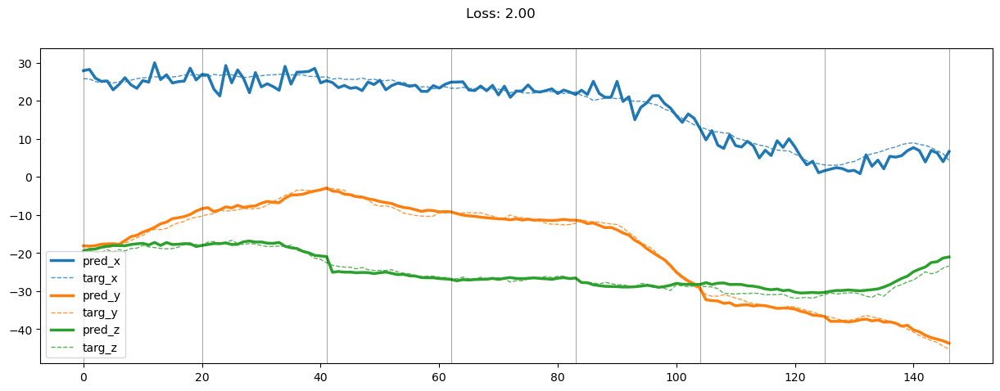

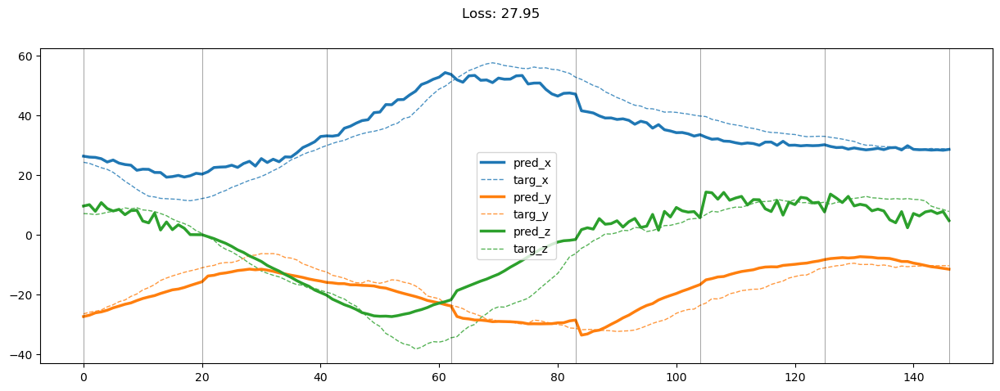

00199: train loss:  8.556, imu loss:  0.676, mag loss:  7.880
       valid loss:  172.387, imu loss:  0.509, mag loss:  171.878
00219: train loss:  8.473, imu loss:  0.671, mag loss:  7.803
       valid loss:  173.285, imu loss:  0.509, mag loss:  172.777
00239: train loss:  8.561, imu loss:  0.678, mag loss:  7.883
       valid loss:  170.808, imu loss:  0.509, mag loss:  170.299
00259: train loss:  8.270, imu loss:  0.680, mag loss:  7.590
       valid loss:  172.500, imu loss:  0.509, mag loss:  171.992
00279: train loss:  8.217, imu loss:  0.673, mag loss:  7.543
       valid loss:  172.700, imu loss:  0.509, mag loss:  172.191
00299: train loss:  8.159, imu loss:  0.679, mag loss:  7.480
       valid loss:  172.311, imu loss:  0.509, mag loss:  171.803
00319: train loss:  8.318, imu loss:  0.687, mag loss:  7.631
       valid loss:  173.135, imu loss:  0.509, mag loss:  172.627
00339: train loss:  8.465, imu loss:  0.684, mag loss:  7.781
       valid loss:  174.849, imu loss:  0.

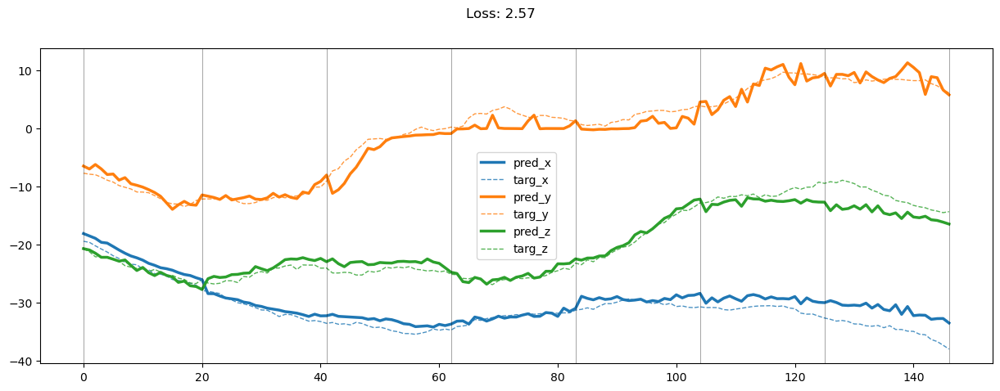

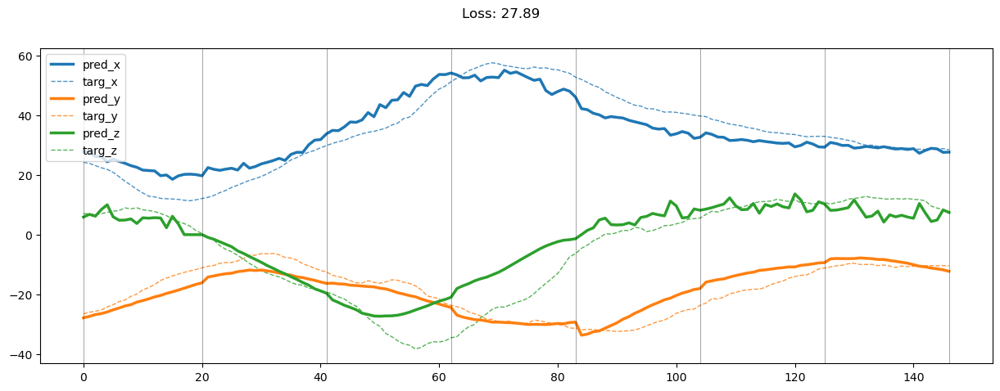

00399: train loss:  8.134, imu loss:  0.674, mag loss:  7.460
       valid loss:  172.682, imu loss:  0.509, mag loss:  172.174
00419: train loss:  8.007, imu loss:  0.680, mag loss:  7.327
       valid loss:  173.661, imu loss:  0.509, mag loss:  173.152
00439: train loss:  7.966, imu loss:  0.683, mag loss:  7.284
       valid loss:  171.928, imu loss:  0.509, mag loss:  171.420
00459: train loss:  7.749, imu loss:  0.678, mag loss:  7.071
       valid loss:  174.370, imu loss:  0.509, mag loss:  173.861
00479: train loss:  7.859, imu loss:  0.686, mag loss:  7.174
       valid loss:  174.659, imu loss:  0.509, mag loss:  174.150
00499: train loss:  7.642, imu loss:  0.677, mag loss:  6.965
       valid loss:  175.466, imu loss:  0.509, mag loss:  174.958
00519: train loss:  7.629, imu loss:  0.674, mag loss:  6.955
       valid loss:  175.803, imu loss:  0.509, mag loss:  175.295
00539: train loss:  8.235, imu loss:  0.684, mag loss:  7.552
       valid loss:  175.576, imu loss:  0.

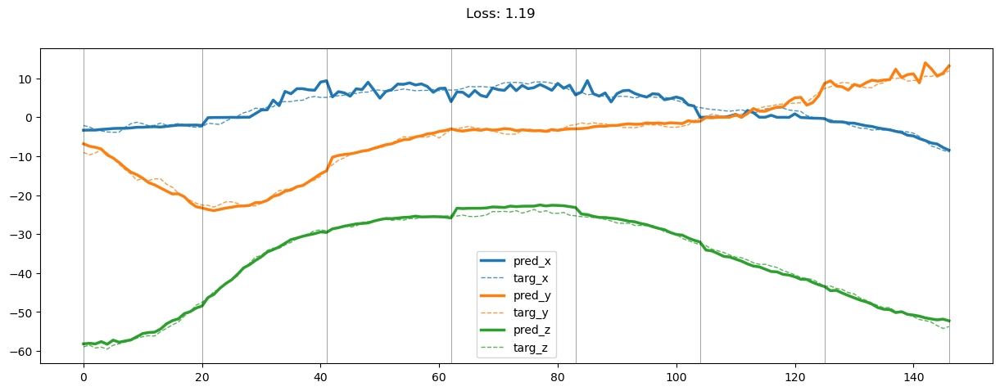

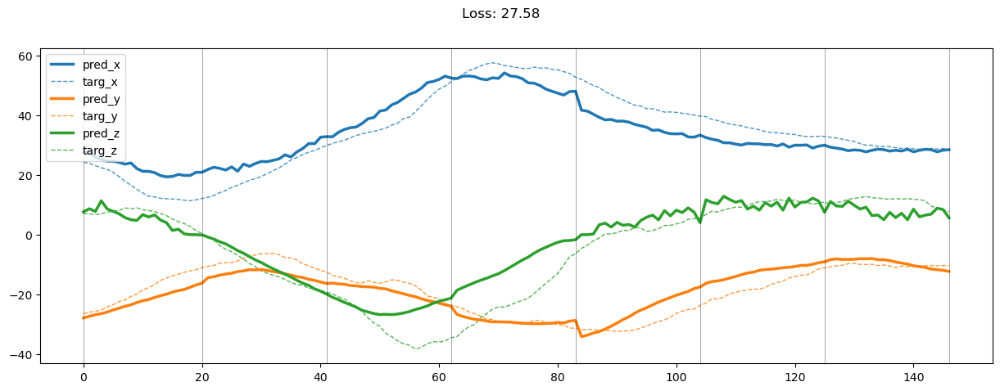

00599: train loss:  7.476, imu loss:  0.674, mag loss:  6.803
       valid loss:  172.752, imu loss:  0.509, mag loss:  172.243
00619: train loss:  7.454, imu loss:  0.681, mag loss:  6.773
       valid loss:  173.814, imu loss:  0.509, mag loss:  173.305
00639: train loss:  7.306, imu loss:  0.676, mag loss:  6.630
       valid loss:  172.801, imu loss:  0.509, mag loss:  172.292
00659: train loss:  7.134, imu loss:  0.679, mag loss:  6.456
       valid loss:  172.072, imu loss:  0.509, mag loss:  171.563
00679: train loss:  7.375, imu loss:  0.677, mag loss:  6.698
       valid loss:  173.095, imu loss:  0.509, mag loss:  172.586
00699: train loss:  7.231, imu loss:  0.679, mag loss:  6.551
       valid loss:  171.561, imu loss:  0.509, mag loss:  171.052
00719: train loss:  7.068, imu loss:  0.682, mag loss:  6.387
       valid loss:  171.078, imu loss:  0.509, mag loss:  170.569
00739: train loss:  7.177, imu loss:  0.684, mag loss:  6.493
       valid loss:  171.767, imu loss:  0.

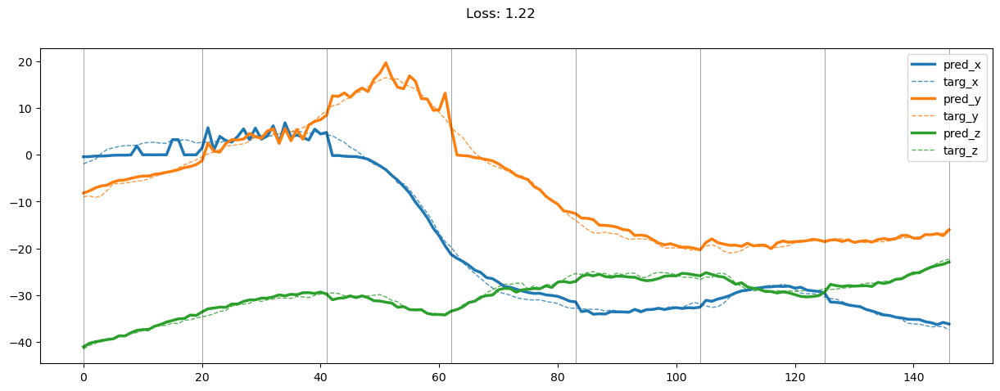

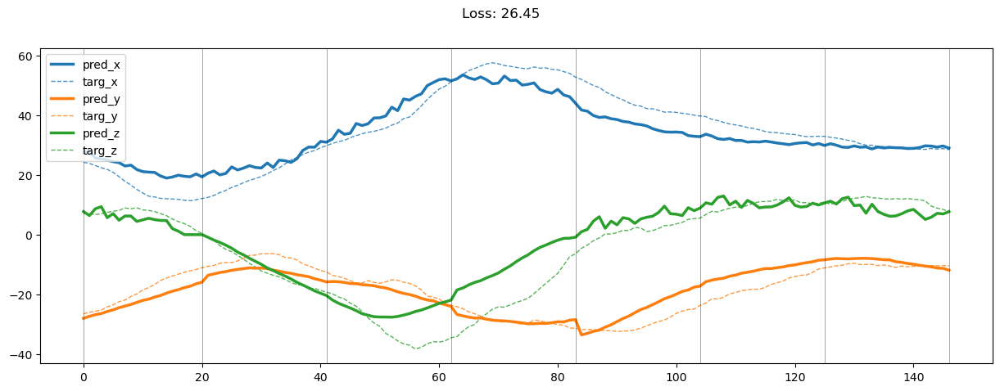

00799: train loss:  7.247, imu loss:  0.677, mag loss:  6.570
       valid loss:  172.963, imu loss:  0.509, mag loss:  172.455
00819: train loss:  7.022, imu loss:  0.680, mag loss:  6.342
       valid loss:  173.209, imu loss:  0.509, mag loss:  172.700
00839: train loss:  6.964, imu loss:  0.679, mag loss:  6.286
       valid loss:  172.370, imu loss:  0.509, mag loss:  171.861
00859: train loss:  6.749, imu loss:  0.686, mag loss:  6.062
       valid loss:  172.651, imu loss:  0.509, mag loss:  172.142
00879: train loss:  6.737, imu loss:  0.672, mag loss:  6.065
       valid loss:  174.200, imu loss:  0.509, mag loss:  173.691
00899: train loss:  6.697, imu loss:  0.680, mag loss:  6.017
       valid loss:  174.623, imu loss:  0.509, mag loss:  174.114
00919: train loss:  6.833, imu loss:  0.680, mag loss:  6.153
       valid loss:  173.423, imu loss:  0.509, mag loss:  172.915
00939: train loss:  6.770, imu loss:  0.677, mag loss:  6.093
       valid loss:  174.569, imu loss:  0.

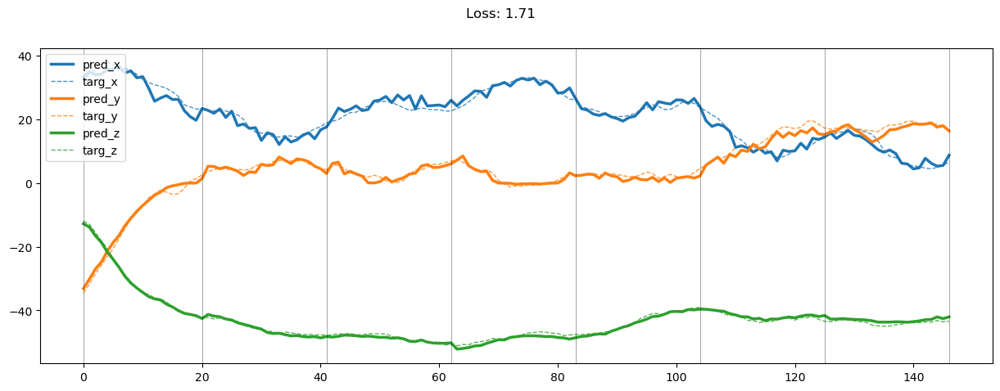

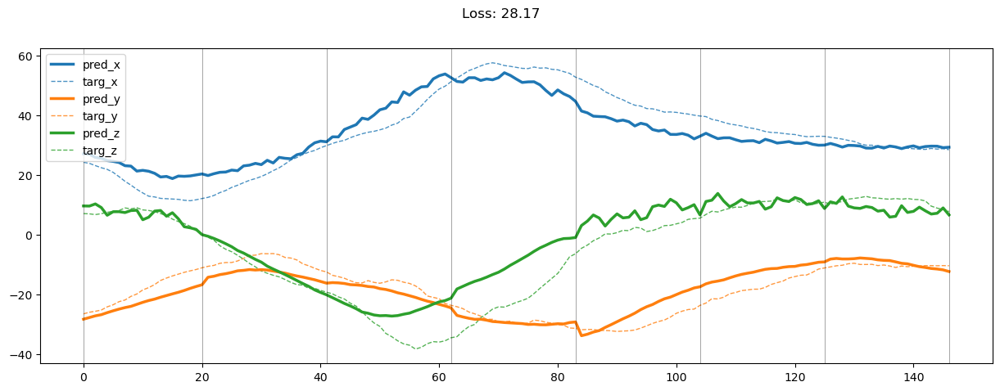

00999: train loss:  6.528, imu loss:  0.680, mag loss:  5.848
       valid loss:  171.753, imu loss:  0.509, mag loss:  171.245
01019: train loss:  6.535, imu loss:  0.688, mag loss:  5.847
       valid loss:  170.056, imu loss:  0.509, mag loss:  169.548
01039: train loss:  6.353, imu loss:  0.684, mag loss:  5.669
       valid loss:  168.870, imu loss:  0.509, mag loss:  168.361
01059: train loss:  6.269, imu loss:  0.682, mag loss:  5.587
       valid loss:  172.720, imu loss:  0.509, mag loss:  172.211
01079: train loss:  6.194, imu loss:  0.674, mag loss:  5.520
       valid loss:  172.162, imu loss:  0.509, mag loss:  171.653
01099: train loss:  6.370, imu loss:  0.671, mag loss:  5.699
       valid loss:  171.453, imu loss:  0.509, mag loss:  170.945
01119: train loss:  6.328, imu loss:  0.682, mag loss:  5.646
       valid loss:  171.219, imu loss:  0.509, mag loss:  170.710
01139: train loss:  6.251, imu loss:  0.672, mag loss:  5.579
       valid loss:  173.181, imu loss:  0.

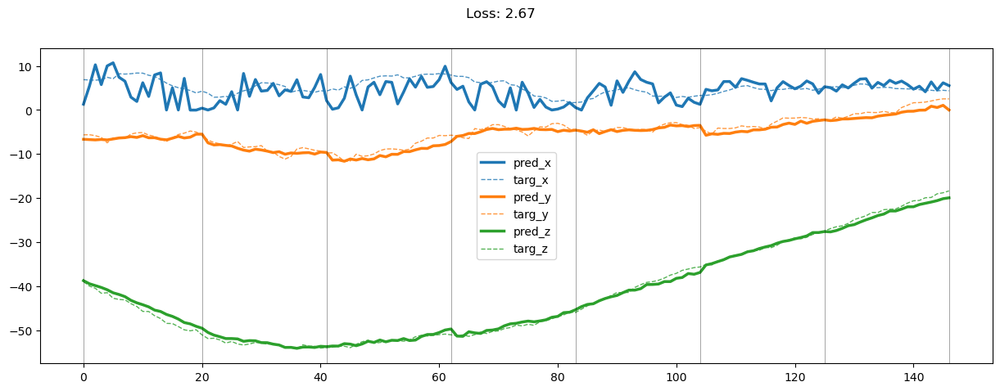

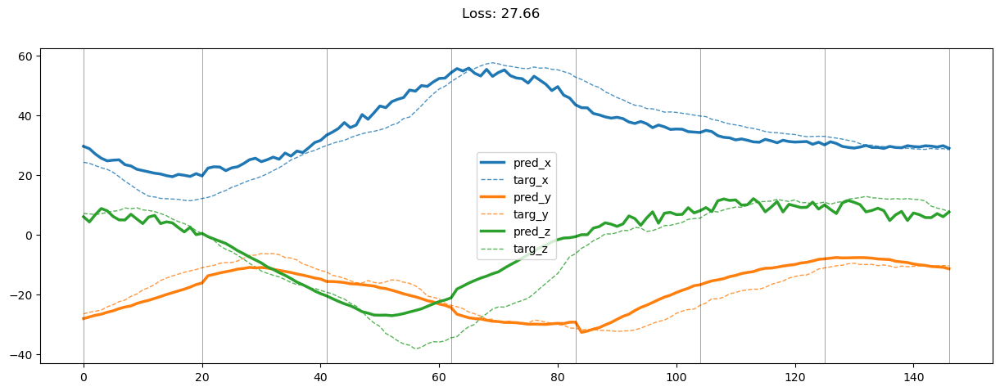

01199: train loss:  6.157, imu loss:  0.687, mag loss:  5.470
       valid loss:  168.766, imu loss:  0.509, mag loss:  168.258
01219: train loss:  5.963, imu loss:  0.680, mag loss:  5.283
       valid loss:  169.207, imu loss:  0.509, mag loss:  168.699
01239: train loss:  6.038, imu loss:  0.677, mag loss:  5.362
       valid loss:  169.228, imu loss:  0.509, mag loss:  168.720
01259: train loss:  5.905, imu loss:  0.677, mag loss:  5.228
       valid loss:  173.295, imu loss:  0.509, mag loss:  172.786
01279: train loss:  5.984, imu loss:  0.674, mag loss:  5.310
       valid loss:  170.535, imu loss:  0.509, mag loss:  170.027
01299: train loss:  5.807, imu loss:  0.676, mag loss:  5.131
       valid loss:  171.939, imu loss:  0.509, mag loss:  171.431
01319: train loss:  5.787, imu loss:  0.680, mag loss:  5.107
       valid loss:  171.315, imu loss:  0.509, mag loss:  170.807
01339: train loss:  5.689, imu loss:  0.675, mag loss:  5.014
       valid loss:  170.502, imu loss:  0.

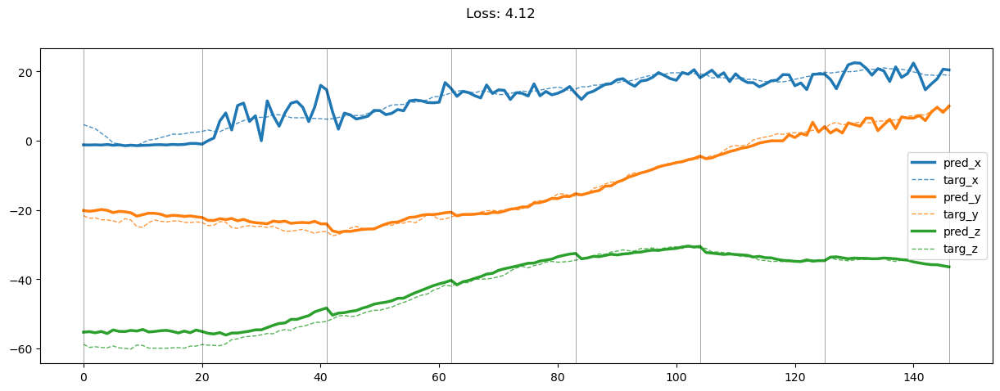

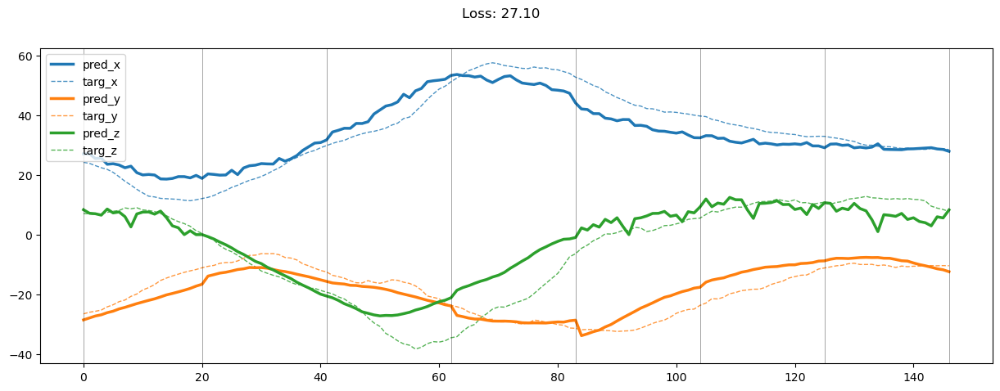

01399: train loss:  5.661, imu loss:  0.677, mag loss:  4.984
       valid loss:  171.798, imu loss:  0.509, mag loss:  171.289
01419: train loss:  5.644, imu loss:  0.678, mag loss:  4.966
       valid loss:  170.955, imu loss:  0.509, mag loss:  170.446
01439: train loss:  5.586, imu loss:  0.679, mag loss:  4.908
       valid loss:  164.848, imu loss:  0.509, mag loss:  164.339
01459: train loss:  5.556, imu loss:  0.681, mag loss:  4.876
       valid loss:  165.832, imu loss:  0.509, mag loss:  165.323
01479: train loss:  5.429, imu loss:  0.675, mag loss:  4.754
       valid loss:  167.378, imu loss:  0.509, mag loss:  166.870
01499: train loss:  5.510, imu loss:  0.690, mag loss:  4.820
       valid loss:  169.281, imu loss:  0.509, mag loss:  168.773
01519: train loss:  5.383, imu loss:  0.681, mag loss:  4.702
       valid loss:  167.978, imu loss:  0.509, mag loss:  167.469
01539: train loss:  5.312, imu loss:  0.675, mag loss:  4.637
       valid loss:  167.426, imu loss:  0.

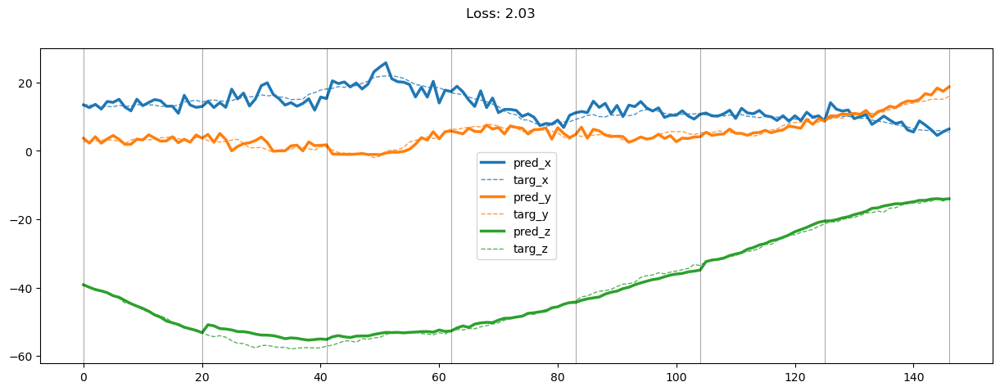

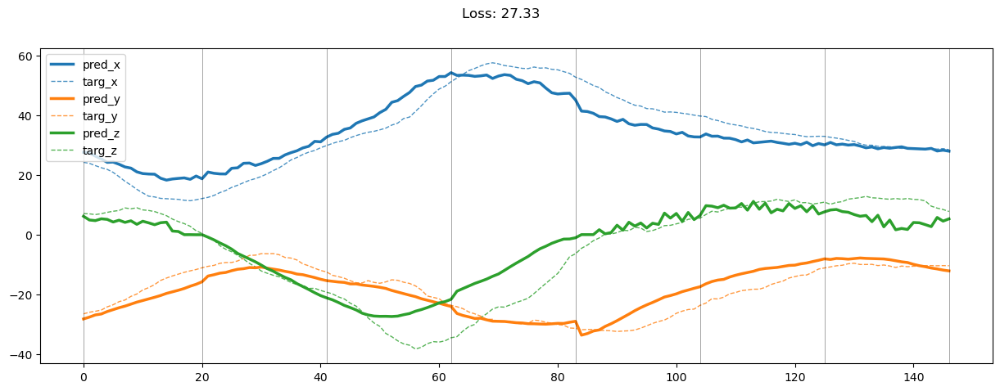

01599: train loss:  5.256, imu loss:  0.679, mag loss:  4.577
       valid loss:  171.160, imu loss:  0.509, mag loss:  170.651
01619: train loss:  5.316, imu loss:  0.681, mag loss:  4.636
       valid loss:  170.209, imu loss:  0.509, mag loss:  169.700
01639: train loss:  5.331, imu loss:  0.676, mag loss:  4.655
       valid loss:  169.813, imu loss:  0.509, mag loss:  169.304
01659: train loss:  5.236, imu loss:  0.673, mag loss:  4.564
       valid loss:  170.958, imu loss:  0.509, mag loss:  170.449
01679: train loss:  5.185, imu loss:  0.679, mag loss:  4.506
       valid loss:  172.054, imu loss:  0.509, mag loss:  171.545
01699: train loss:  5.077, imu loss:  0.677, mag loss:  4.400
       valid loss:  174.943, imu loss:  0.509, mag loss:  174.435
01719: train loss:  5.098, imu loss:  0.671, mag loss:  4.427
       valid loss:  174.245, imu loss:  0.509, mag loss:  173.736
01739: train loss:  5.126, imu loss:  0.678, mag loss:  4.448
       valid loss:  173.628, imu loss:  0.

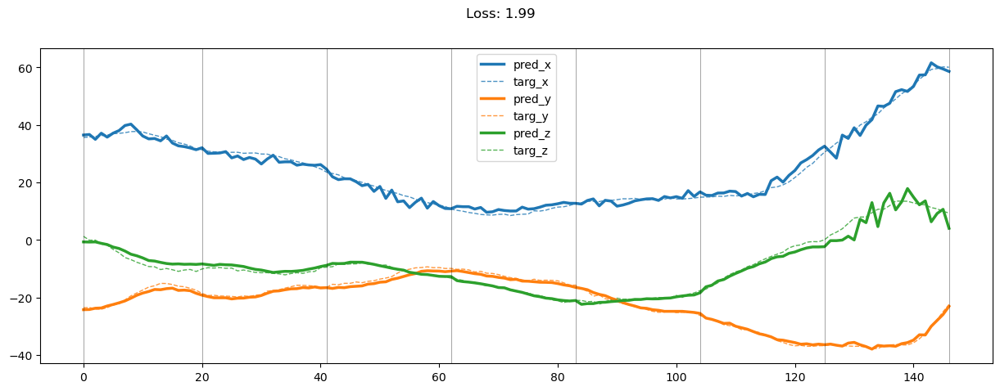

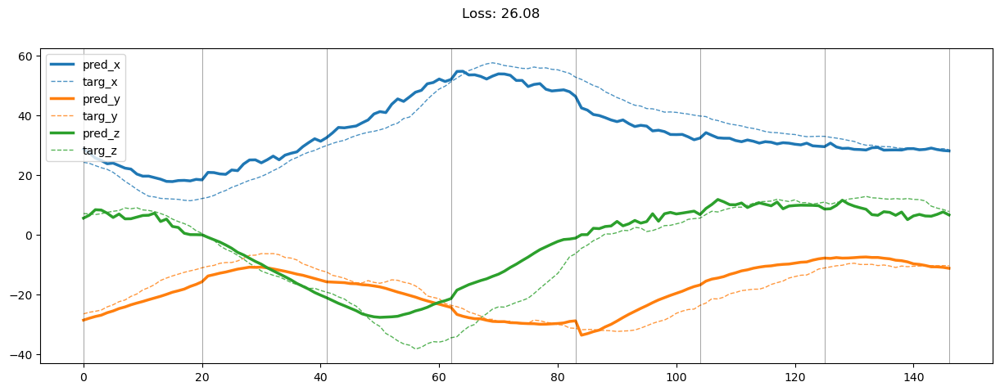

01799: train loss:  5.062, imu loss:  0.680, mag loss:  4.381
       valid loss:  172.979, imu loss:  0.509, mag loss:  172.470
01819: train loss:  4.938, imu loss:  0.674, mag loss:  4.264
       valid loss:  172.021, imu loss:  0.509, mag loss:  171.513
01839: train loss:  4.944, imu loss:  0.677, mag loss:  4.267
       valid loss:  172.141, imu loss:  0.509, mag loss:  171.633
01859: train loss:  4.867, imu loss:  0.677, mag loss:  4.190
       valid loss:  172.086, imu loss:  0.509, mag loss:  171.577
01879: train loss:  4.740, imu loss:  0.677, mag loss:  4.064
       valid loss:  173.158, imu loss:  0.509, mag loss:  172.649
01899: train loss:  4.882, imu loss:  0.678, mag loss:  4.204
       valid loss:  175.780, imu loss:  0.509, mag loss:  175.272
01919: train loss:  4.887, imu loss:  0.672, mag loss:  4.215
       valid loss:  172.414, imu loss:  0.509, mag loss:  171.905
01939: train loss:  4.772, imu loss:  0.678, mag loss:  4.094
       valid loss:  172.626, imu loss:  0.

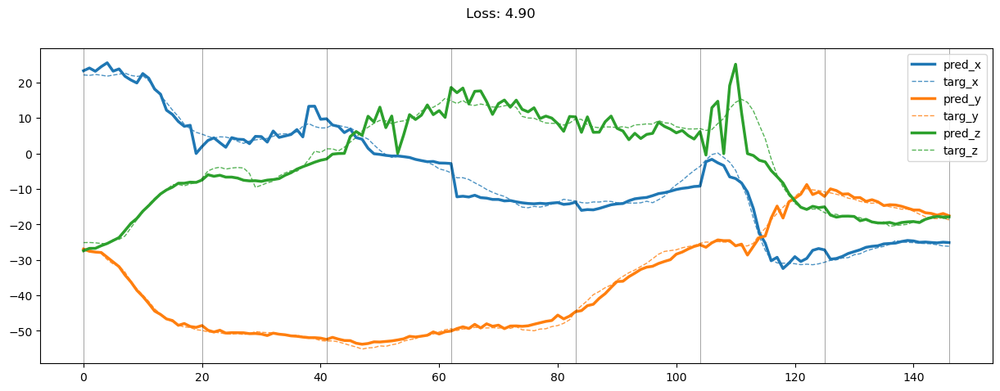

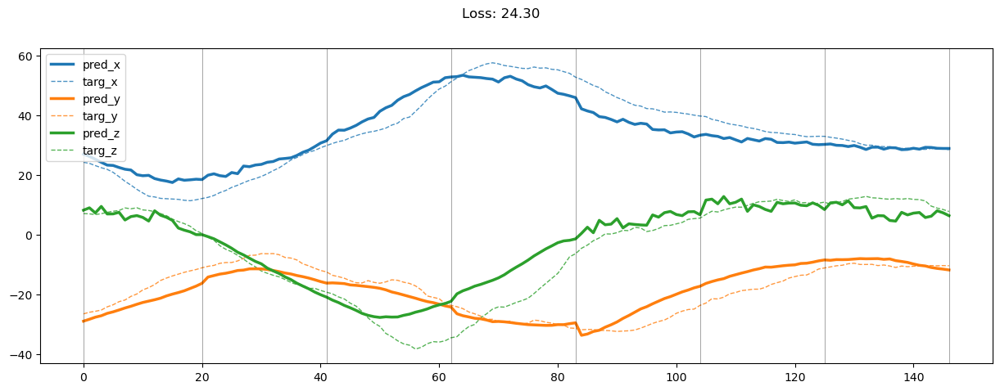

01999: train loss:  4.722, imu loss:  0.677, mag loss:  4.045
       valid loss:  170.730, imu loss:  0.509, mag loss:  170.221
02019: train loss:  4.528, imu loss:  0.676, mag loss:  3.853
       valid loss:  171.857, imu loss:  0.509, mag loss:  171.348
02039: train loss:  4.619, imu loss:  0.681, mag loss:  3.938
       valid loss:  171.726, imu loss:  0.509, mag loss:  171.217
02059: train loss:  4.579, imu loss:  0.680, mag loss:  3.899
       valid loss:  171.533, imu loss:  0.509, mag loss:  171.025
02079: train loss:  4.632, imu loss:  0.680, mag loss:  3.952
       valid loss:  171.824, imu loss:  0.509, mag loss:  171.315
02099: train loss:  4.546, imu loss:  0.674, mag loss:  3.872
       valid loss:  172.699, imu loss:  0.509, mag loss:  172.190
02119: train loss:  4.461, imu loss:  0.676, mag loss:  3.785
       valid loss:  169.920, imu loss:  0.509, mag loss:  169.411
02139: train loss:  33.240, imu loss:  0.688, mag loss:  32.552
       valid loss:  184.382, imu loss:  

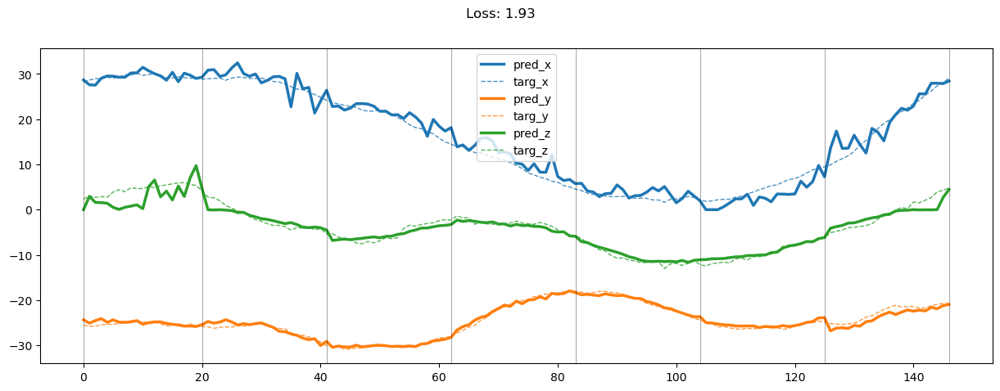

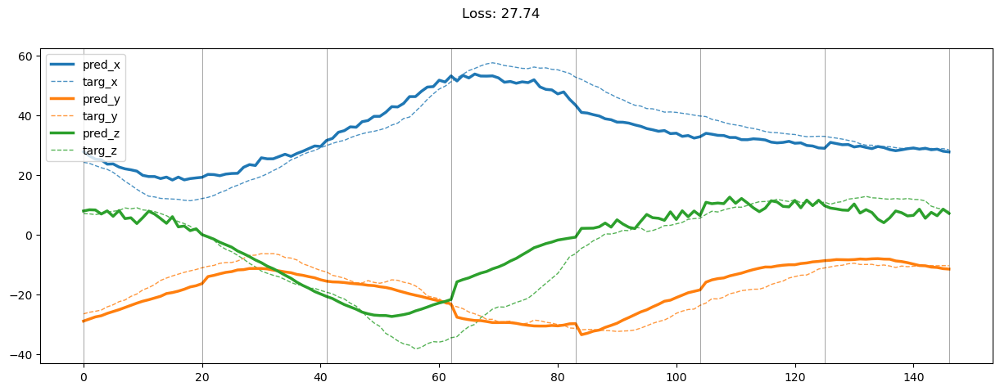

02199: train loss:  4.869, imu loss:  0.686, mag loss:  4.183
       valid loss:  171.764, imu loss:  0.509, mag loss:  171.255
02219: train loss:  4.595, imu loss:  0.677, mag loss:  3.917
       valid loss:  171.485, imu loss:  0.509, mag loss:  170.977
02239: train loss:  4.665, imu loss:  0.684, mag loss:  3.981
       valid loss:  171.511, imu loss:  0.509, mag loss:  171.002
02259: train loss:  4.670, imu loss:  0.683, mag loss:  3.987
       valid loss:  172.098, imu loss:  0.509, mag loss:  171.589
02279: train loss:  4.504, imu loss:  0.676, mag loss:  3.829
       valid loss:  172.847, imu loss:  0.509, mag loss:  172.339
02299: train loss:  4.400, imu loss:  0.681, mag loss:  3.720
       valid loss:  171.802, imu loss:  0.509, mag loss:  171.294
02319: train loss:  4.322, imu loss:  0.681, mag loss:  3.641
       valid loss:  173.650, imu loss:  0.509, mag loss:  173.142
02339: train loss:  4.407, imu loss:  0.680, mag loss:  3.727
       valid loss:  172.424, imu loss:  0.

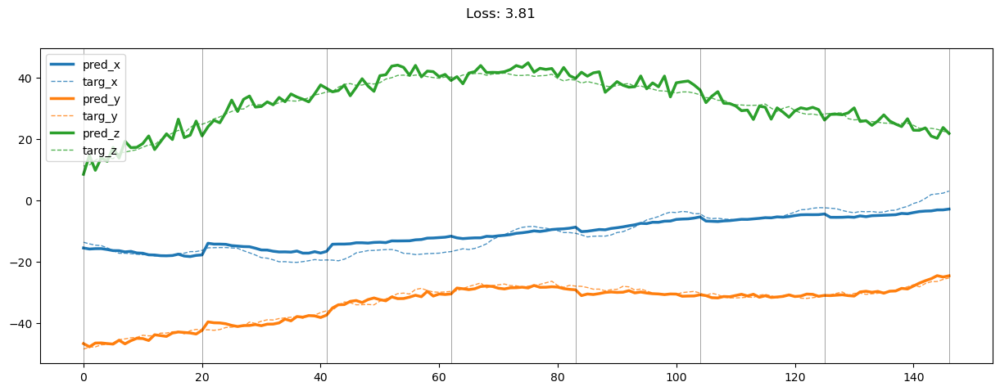

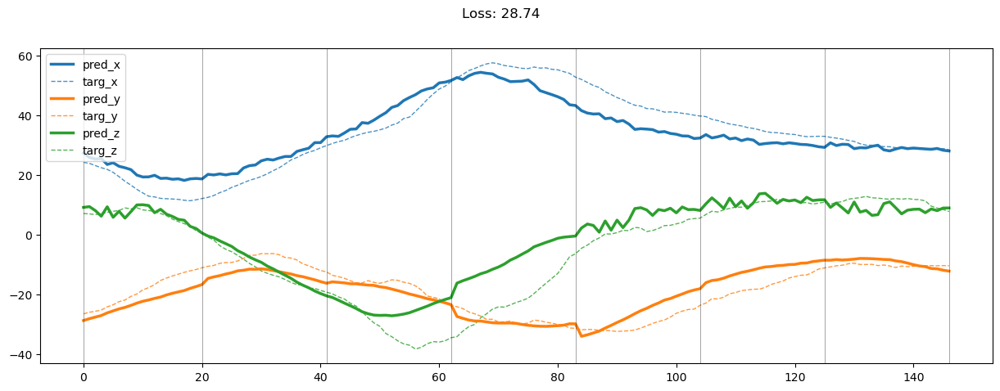

02399: train loss:  4.227, imu loss:  0.681, mag loss:  3.545
       valid loss:  173.294, imu loss:  0.509, mag loss:  172.786
02419: train loss:  4.212, imu loss:  0.675, mag loss:  3.537
       valid loss:  171.379, imu loss:  0.509, mag loss:  170.871
02439: train loss:  4.191, imu loss:  0.685, mag loss:  3.506
       valid loss:  172.122, imu loss:  0.509, mag loss:  171.614
02459: train loss:  4.074, imu loss:  0.673, mag loss:  3.401
       valid loss:  170.578, imu loss:  0.509, mag loss:  170.069
02479: train loss:  4.251, imu loss:  0.676, mag loss:  3.575
       valid loss:  171.576, imu loss:  0.509, mag loss:  171.067
02499: train loss:  4.024, imu loss:  0.678, mag loss:  3.346
       valid loss:  169.674, imu loss:  0.509, mag loss:  169.165
02519: train loss:  4.040, imu loss:  0.686, mag loss:  3.353
       valid loss:  169.991, imu loss:  0.509, mag loss:  169.482
02539: train loss:  3.995, imu loss:  0.675, mag loss:  3.320
       valid loss:  170.639, imu loss:  0.

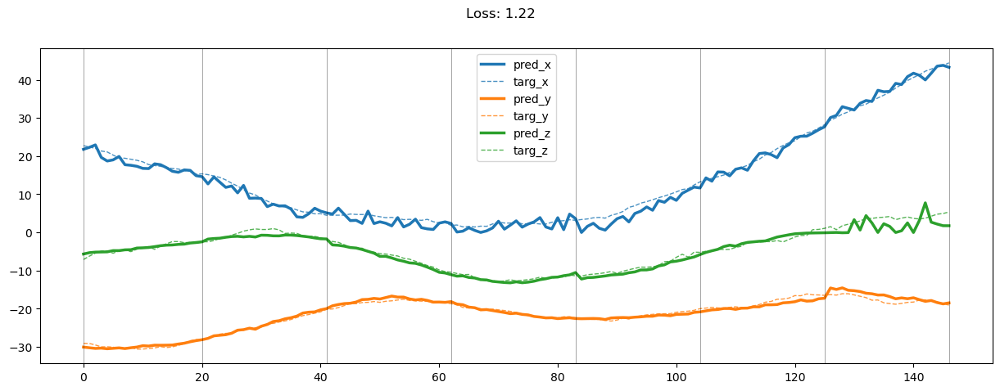

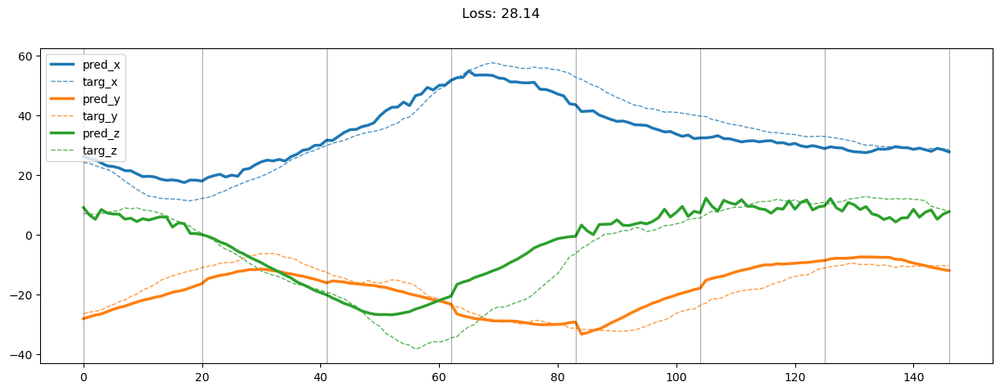

02599: train loss:  4.030, imu loss:  0.680, mag loss:  3.350
       valid loss:  170.858, imu loss:  0.509, mag loss:  170.350
02619: train loss:  4.082, imu loss:  0.681, mag loss:  3.401
       valid loss:  170.971, imu loss:  0.509, mag loss:  170.462
02639: train loss:  4.063, imu loss:  0.673, mag loss:  3.390
       valid loss:  170.246, imu loss:  0.509, mag loss:  169.737
02659: train loss:  4.041, imu loss:  0.671, mag loss:  3.370
       valid loss:  169.772, imu loss:  0.509, mag loss:  169.264
02679: train loss:  3.876, imu loss:  0.686, mag loss:  3.190
       valid loss:  171.481, imu loss:  0.509, mag loss:  170.972
02699: train loss:  4.220, imu loss:  0.673, mag loss:  3.547
       valid loss:  169.931, imu loss:  0.509, mag loss:  169.422
02719: train loss:  4.129, imu loss:  0.680, mag loss:  3.449
       valid loss:  171.268, imu loss:  0.509, mag loss:  170.759
02739: train loss:  3.815, imu loss:  0.679, mag loss:  3.136
       valid loss:  170.035, imu loss:  0.

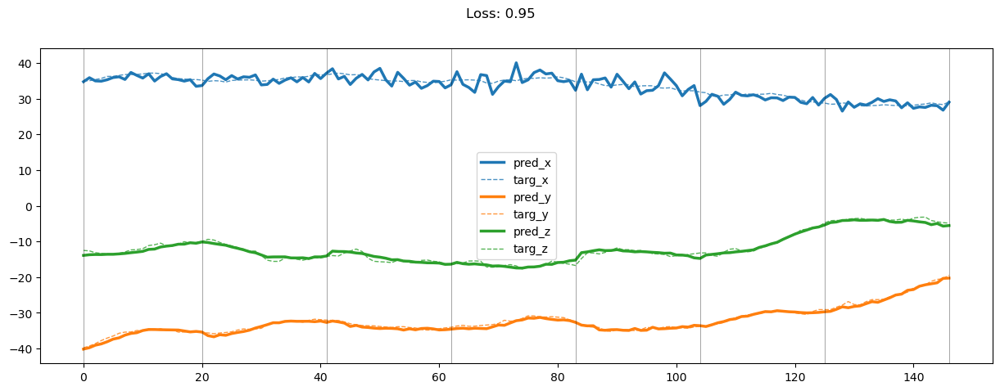

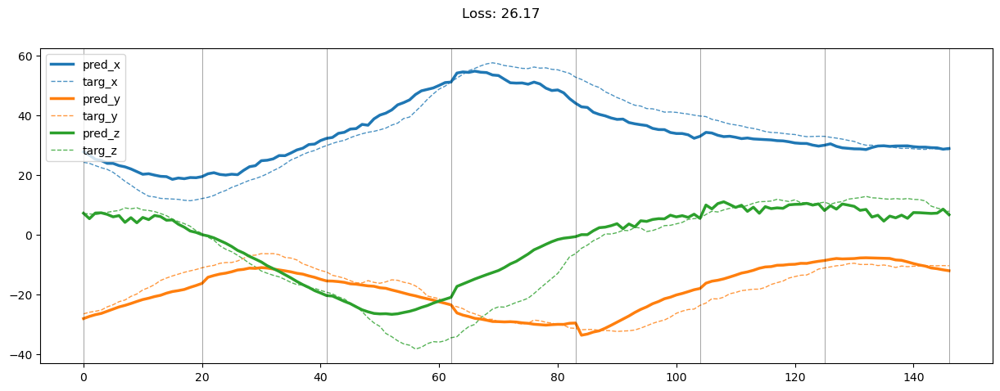

02799: train loss:  3.768, imu loss:  0.672, mag loss:  3.097
       valid loss:  168.340, imu loss:  0.509, mag loss:  167.831
02819: train loss:  3.778, imu loss:  0.683, mag loss:  3.095
       valid loss:  171.855, imu loss:  0.509, mag loss:  171.347
02839: train loss:  3.620, imu loss:  0.683, mag loss:  2.937
       valid loss:  170.424, imu loss:  0.509, mag loss:  169.915
02859: train loss:  3.844, imu loss:  0.679, mag loss:  3.166
       valid loss:  171.196, imu loss:  0.509, mag loss:  170.688
02879: train loss:  3.622, imu loss:  0.673, mag loss:  2.949
       valid loss:  170.791, imu loss:  0.509, mag loss:  170.282
02899: train loss:  3.665, imu loss:  0.678, mag loss:  2.987
       valid loss:  171.367, imu loss:  0.509, mag loss:  170.859
02919: train loss:  3.842, imu loss:  0.683, mag loss:  3.158
       valid loss:  172.317, imu loss:  0.509, mag loss:  171.808
02939: train loss:  3.592, imu loss:  0.682, mag loss:  2.911
       valid loss:  170.726, imu loss:  0.

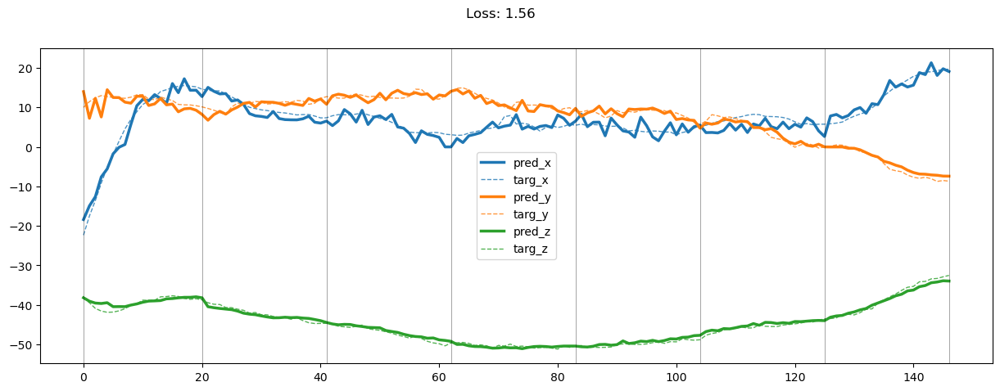

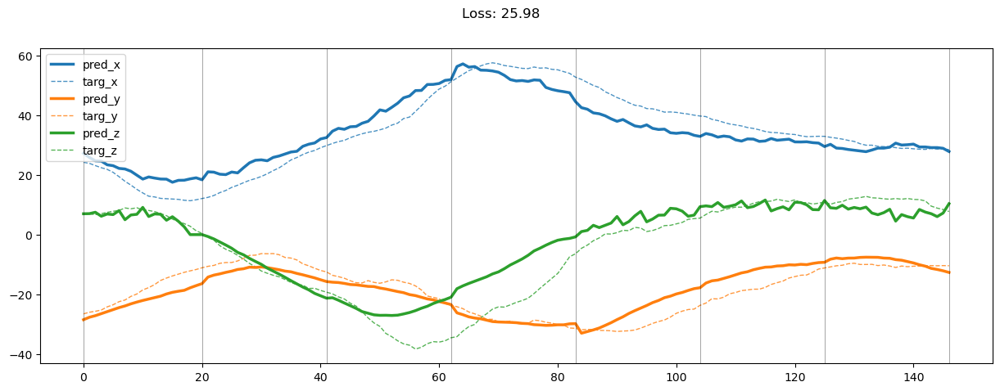

02999: train loss:  3.566, imu loss:  0.677, mag loss:  2.889
       valid loss:  172.509, imu loss:  0.509, mag loss:  172.001
03019: train loss:  3.584, imu loss:  0.681, mag loss:  2.903
       valid loss:  171.102, imu loss:  0.509, mag loss:  170.593
03039: train loss:  3.650, imu loss:  0.680, mag loss:  2.970
       valid loss:  171.173, imu loss:  0.509, mag loss:  170.664
03059: train loss:  3.465, imu loss:  0.673, mag loss:  2.792
       valid loss:  172.913, imu loss:  0.509, mag loss:  172.405
03079: train loss:  3.536, imu loss:  0.674, mag loss:  2.862
       valid loss:  172.791, imu loss:  0.509, mag loss:  172.282
03099: train loss:  3.550, imu loss:  0.681, mag loss:  2.869
       valid loss:  170.635, imu loss:  0.509, mag loss:  170.126
03119: train loss:  3.543, imu loss:  0.673, mag loss:  2.870
       valid loss:  172.104, imu loss:  0.509, mag loss:  171.595
03139: train loss:  3.386, imu loss:  0.686, mag loss:  2.700
       valid loss:  172.776, imu loss:  0.

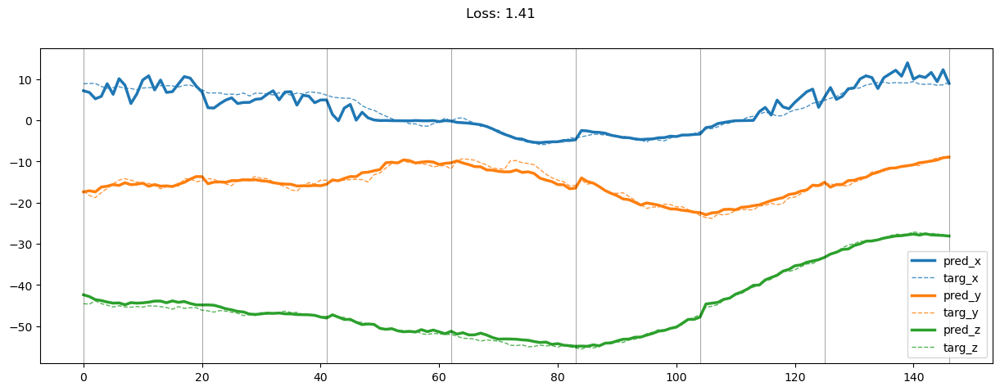

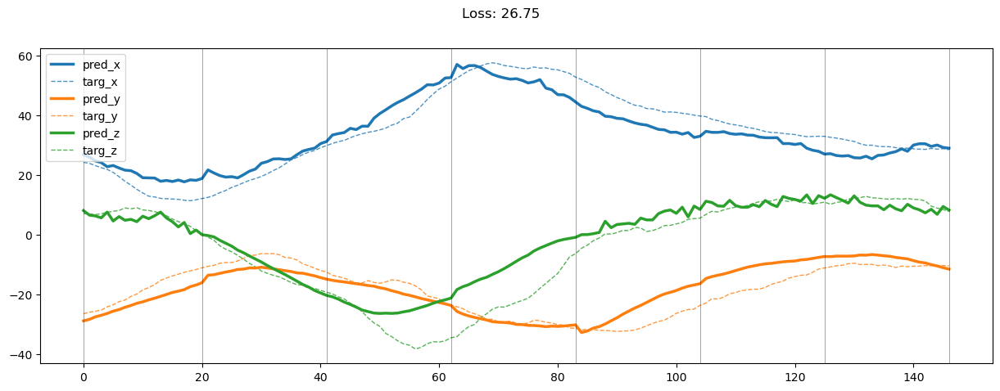

03199: train loss:  3.792, imu loss:  0.687, mag loss:  3.105
       valid loss:  172.383, imu loss:  0.509, mag loss:  171.875
03219: train loss:  3.527, imu loss:  0.675, mag loss:  2.852
       valid loss:  171.734, imu loss:  0.509, mag loss:  171.225
03239: train loss:  3.622, imu loss:  0.675, mag loss:  2.947
       valid loss:  171.205, imu loss:  0.509, mag loss:  170.697
03259: train loss:  3.461, imu loss:  0.683, mag loss:  2.779
       valid loss:  170.589, imu loss:  0.509, mag loss:  170.081
03279: train loss:  3.446, imu loss:  0.692, mag loss:  2.754
       valid loss:  169.980, imu loss:  0.509, mag loss:  169.472
03299: train loss:  3.283, imu loss:  0.675, mag loss:  2.608
       valid loss:  170.058, imu loss:  0.509, mag loss:  169.549
03319: train loss:  3.304, imu loss:  0.677, mag loss:  2.627
       valid loss:  168.475, imu loss:  0.509, mag loss:  167.966
03339: train loss:  3.427, imu loss:  0.676, mag loss:  2.751
       valid loss:  168.403, imu loss:  0.

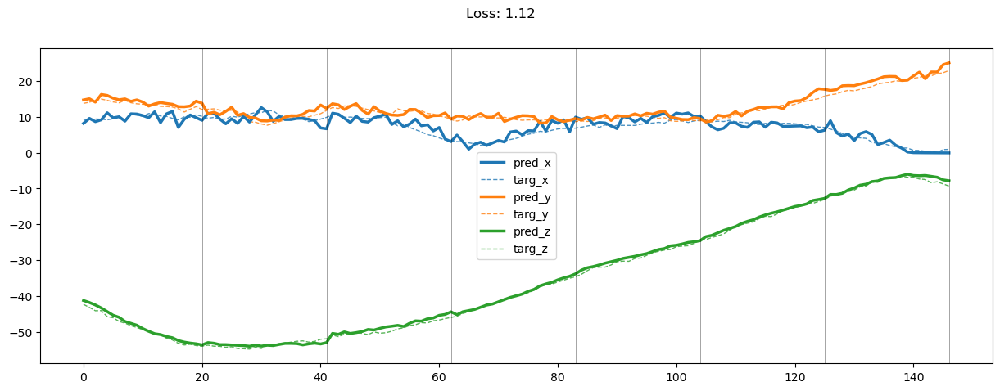

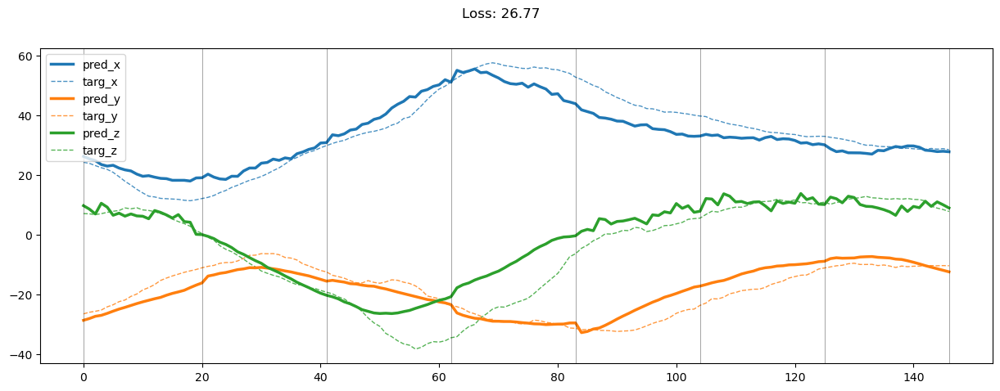

03399: train loss:  3.329, imu loss:  0.680, mag loss:  2.649
       valid loss:  169.438, imu loss:  0.509, mag loss:  168.929
03419: train loss:  3.253, imu loss:  0.675, mag loss:  2.578
       valid loss:  169.438, imu loss:  0.509, mag loss:  168.930
03439: train loss:  3.252, imu loss:  0.684, mag loss:  2.568
       valid loss:  169.684, imu loss:  0.509, mag loss:  169.175
03459: train loss:  3.385, imu loss:  0.679, mag loss:  2.706
       valid loss:  169.841, imu loss:  0.509, mag loss:  169.333
03479: train loss:  3.228, imu loss:  0.683, mag loss:  2.545
       valid loss:  169.807, imu loss:  0.509, mag loss:  169.298
03499: train loss:  3.235, imu loss:  0.686, mag loss:  2.549
       valid loss:  170.827, imu loss:  0.509, mag loss:  170.318
03519: train loss:  3.113, imu loss:  0.675, mag loss:  2.439
       valid loss:  169.248, imu loss:  0.509, mag loss:  168.740
03539: train loss:  3.273, imu loss:  0.680, mag loss:  2.593
       valid loss:  171.309, imu loss:  0.

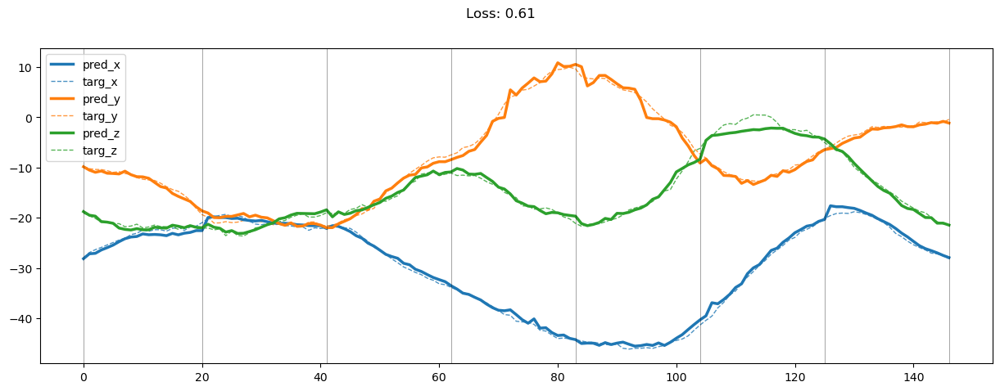

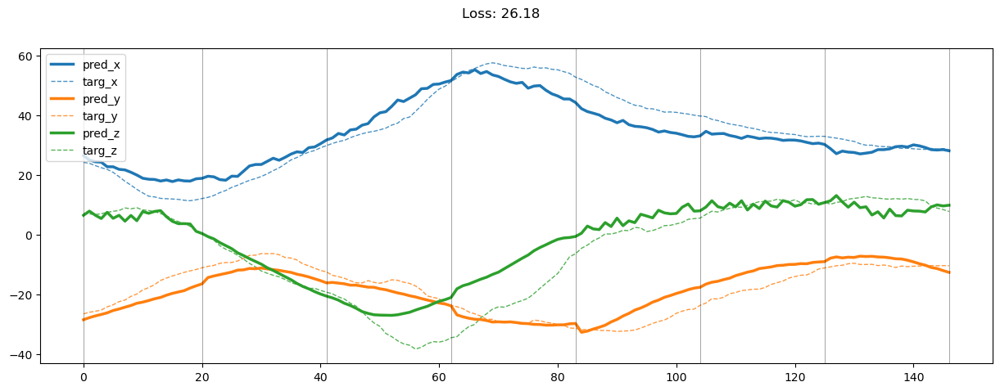

03599: train loss:  3.155, imu loss:  0.688, mag loss:  2.467
       valid loss:  170.714, imu loss:  0.509, mag loss:  170.205
03619: train loss:  3.106, imu loss:  0.677, mag loss:  2.429
       valid loss:  171.467, imu loss:  0.509, mag loss:  170.959
03639: train loss:  3.093, imu loss:  0.675, mag loss:  2.418
       valid loss:  170.944, imu loss:  0.509, mag loss:  170.435
03659: train loss:  3.096, imu loss:  0.678, mag loss:  2.418
       valid loss:  170.950, imu loss:  0.509, mag loss:  170.442
03679: train loss:  3.131, imu loss:  0.672, mag loss:  2.458
       valid loss:  169.524, imu loss:  0.509, mag loss:  169.015
03699: train loss:  4.151, imu loss:  0.677, mag loss:  3.474
       valid loss:  171.829, imu loss:  0.509, mag loss:  171.320
03719: train loss:  3.079, imu loss:  0.678, mag loss:  2.401
       valid loss:  166.334, imu loss:  0.509, mag loss:  165.825
03739: train loss:  3.137, imu loss:  0.676, mag loss:  2.461
       valid loss:  167.129, imu loss:  0.

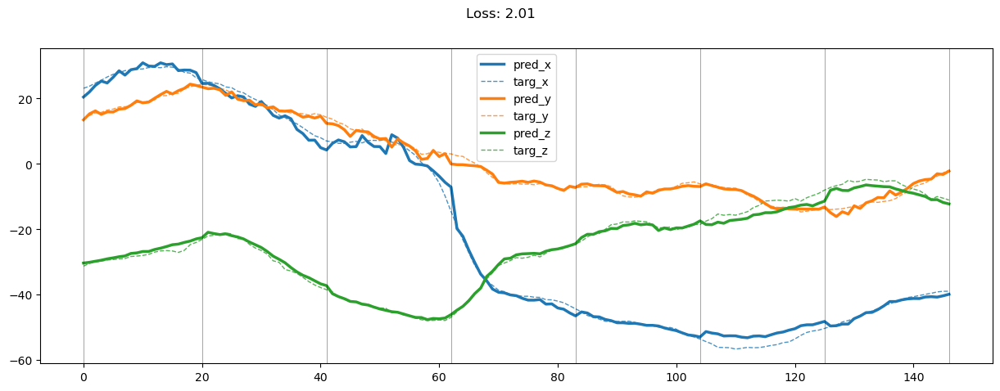

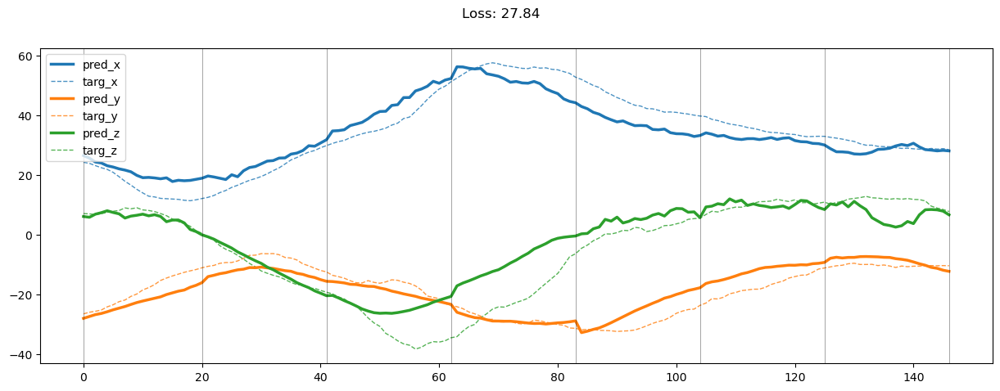

03799: train loss:  2.982, imu loss:  0.678, mag loss:  2.304
       valid loss:  170.846, imu loss:  0.509, mag loss:  170.337
03819: train loss:  2.885, imu loss:  0.683, mag loss:  2.201
       valid loss:  168.532, imu loss:  0.509, mag loss:  168.023
03839: train loss:  2.934, imu loss:  0.674, mag loss:  2.260
       valid loss:  169.246, imu loss:  0.509, mag loss:  168.737
03859: train loss:  2.994, imu loss:  0.679, mag loss:  2.315
       valid loss:  170.574, imu loss:  0.509, mag loss:  170.065
03879: train loss:  3.188, imu loss:  0.681, mag loss:  2.507
       valid loss:  170.020, imu loss:  0.509, mag loss:  169.512
03899: train loss:  2.984, imu loss:  0.675, mag loss:  2.309
       valid loss:  171.594, imu loss:  0.509, mag loss:  171.085
03919: train loss:  2.850, imu loss:  0.670, mag loss:  2.180
       valid loss:  171.408, imu loss:  0.509, mag loss:  170.900
03939: train loss:  2.918, imu loss:  0.679, mag loss:  2.239
       valid loss:  169.724, imu loss:  0.

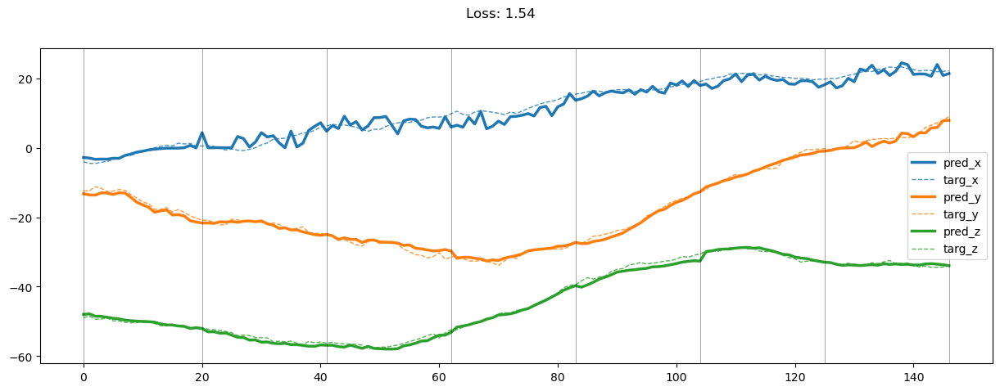

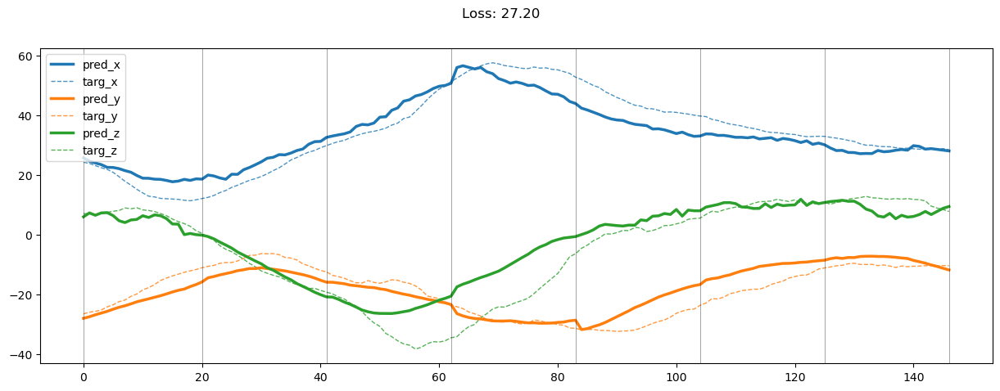

03999: train loss:  2.874, imu loss:  0.676, mag loss:  2.197
       valid loss:  170.778, imu loss:  0.509, mag loss:  170.270
04019: train loss:  2.853, imu loss:  0.674, mag loss:  2.179
       valid loss:  172.623, imu loss:  0.509, mag loss:  172.114
04039: train loss:  2.764, imu loss:  0.677, mag loss:  2.087
       valid loss:  171.761, imu loss:  0.509, mag loss:  171.253
04059: train loss:  2.823, imu loss:  0.675, mag loss:  2.147
       valid loss:  172.144, imu loss:  0.509, mag loss:  171.636
04079: train loss:  2.774, imu loss:  0.672, mag loss:  2.102
       valid loss:  171.114, imu loss:  0.509, mag loss:  170.606
04099: train loss:  2.783, imu loss:  0.679, mag loss:  2.105
       valid loss:  170.367, imu loss:  0.509, mag loss:  169.858
04119: train loss:  2.765, imu loss:  0.677, mag loss:  2.088
       valid loss:  170.620, imu loss:  0.509, mag loss:  170.112
04139: train loss:  2.742, imu loss:  0.678, mag loss:  2.064
       valid loss:  172.157, imu loss:  0.

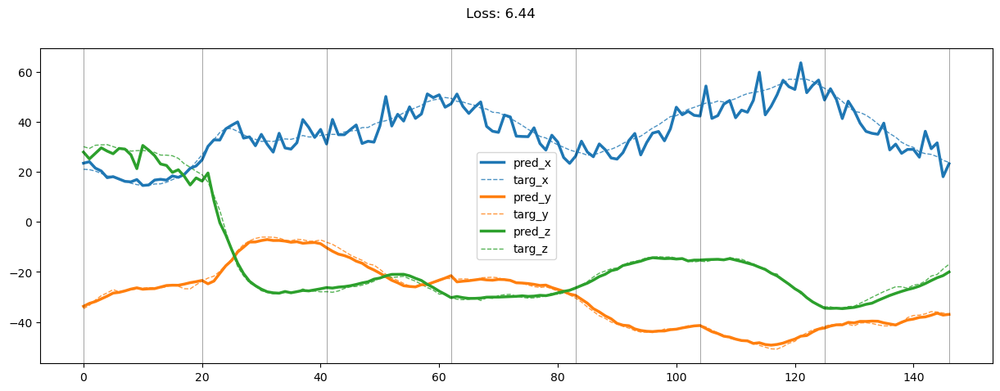

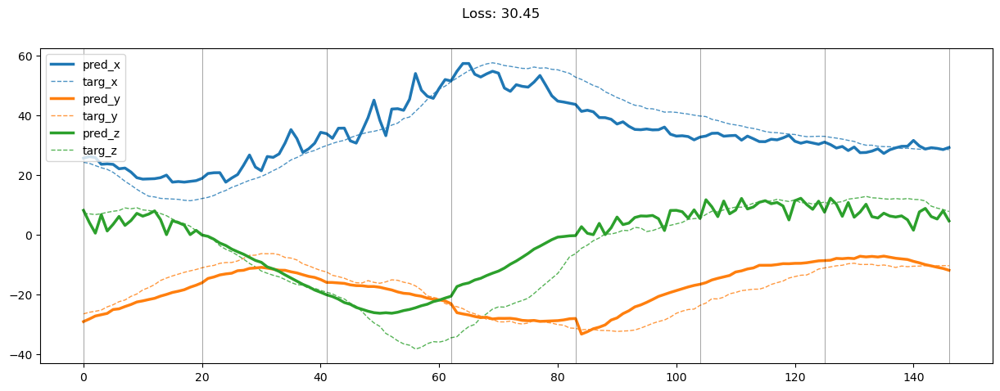

04199: train loss:  4.211, imu loss:  0.681, mag loss:  3.530
       valid loss:  171.203, imu loss:  0.509, mag loss:  170.694
04219: train loss:  2.719, imu loss:  0.681, mag loss:  2.037
       valid loss:  169.567, imu loss:  0.509, mag loss:  169.059
04239: train loss:  2.746, imu loss:  0.678, mag loss:  2.068
       valid loss:  170.506, imu loss:  0.509, mag loss:  169.997
04259: train loss:  2.675, imu loss:  0.675, mag loss:  2.000
       valid loss:  169.007, imu loss:  0.509, mag loss:  168.498
04279: train loss:  2.604, imu loss:  0.672, mag loss:  1.932
       valid loss:  172.677, imu loss:  0.509, mag loss:  172.168
04299: train loss:  2.688, imu loss:  0.678, mag loss:  2.010
       valid loss:  172.215, imu loss:  0.509, mag loss:  171.706
04319: train loss:  2.662, imu loss:  0.679, mag loss:  1.982
       valid loss:  171.033, imu loss:  0.509, mag loss:  170.524
04339: train loss:  2.540, imu loss:  0.675, mag loss:  1.866
       valid loss:  171.519, imu loss:  0.

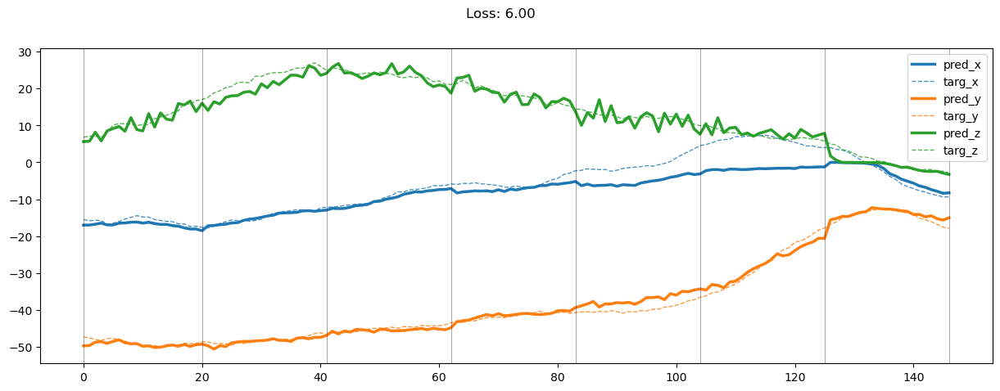

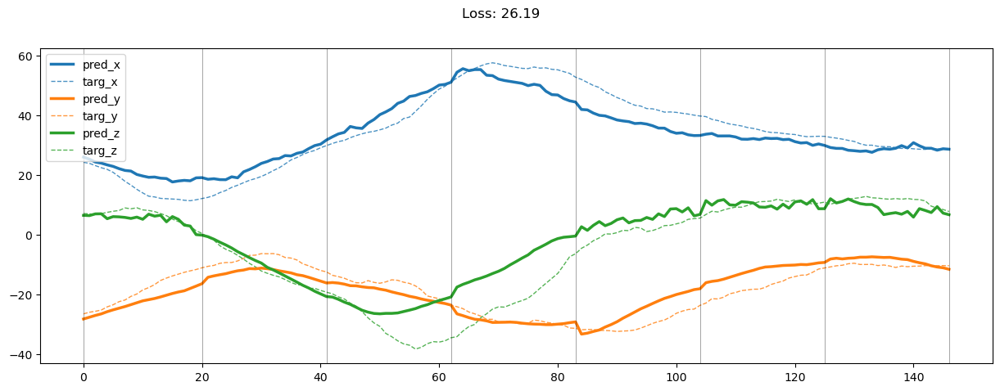

04399: train loss:  2.602, imu loss:  0.680, mag loss:  1.921
       valid loss:  172.183, imu loss:  0.509, mag loss:  171.674
04419: train loss:  2.550, imu loss:  0.685, mag loss:  1.866
       valid loss:  171.182, imu loss:  0.509, mag loss:  170.673
04439: train loss:  2.581, imu loss:  0.681, mag loss:  1.901
       valid loss:  171.763, imu loss:  0.509, mag loss:  171.254
04459: train loss:  2.606, imu loss:  0.677, mag loss:  1.929
       valid loss:  170.831, imu loss:  0.509, mag loss:  170.323
04479: train loss:  2.526, imu loss:  0.682, mag loss:  1.844
       valid loss:  170.372, imu loss:  0.509, mag loss:  169.863
04499: train loss:  2.520, imu loss:  0.679, mag loss:  1.842
       valid loss:  173.575, imu loss:  0.509, mag loss:  173.066
04519: train loss:  2.560, imu loss:  0.676, mag loss:  1.884
       valid loss:  172.958, imu loss:  0.509, mag loss:  172.450
04539: train loss:  2.514, imu loss:  0.675, mag loss:  1.840
       valid loss:  172.369, imu loss:  0.

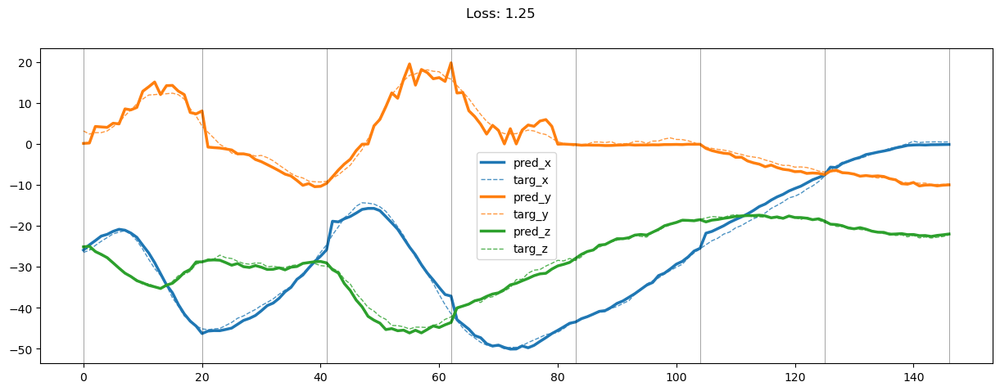

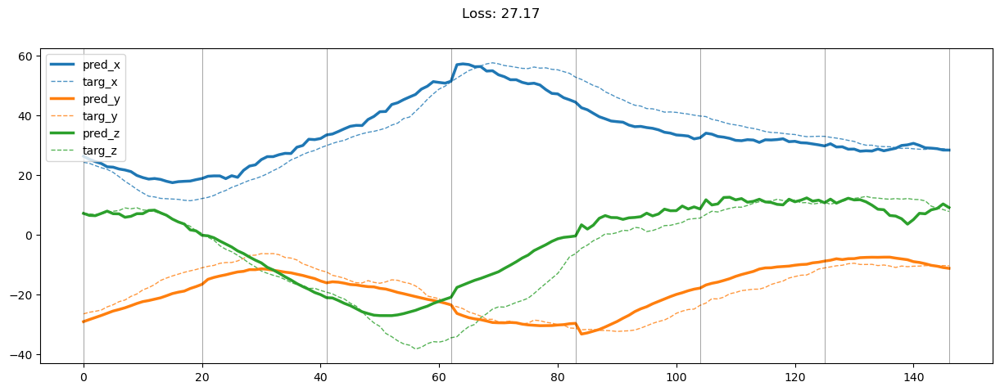

04599: train loss:  2.447, imu loss:  0.673, mag loss:  1.774
       valid loss:  173.882, imu loss:  0.509, mag loss:  173.374
04619: train loss:  2.438, imu loss:  0.677, mag loss:  1.761
       valid loss:  172.201, imu loss:  0.509, mag loss:  171.692
04639: train loss:  2.479, imu loss:  0.676, mag loss:  1.803
       valid loss:  174.141, imu loss:  0.509, mag loss:  173.632
04659: train loss:  2.547, imu loss:  0.679, mag loss:  1.868
       valid loss:  174.386, imu loss:  0.509, mag loss:  173.877
04679: train loss:  2.436, imu loss:  0.674, mag loss:  1.762
       valid loss:  174.273, imu loss:  0.509, mag loss:  173.765
04699: train loss:  2.372, imu loss:  0.672, mag loss:  1.700
       valid loss:  174.339, imu loss:  0.509, mag loss:  173.830
04719: train loss:  2.478, imu loss:  0.683, mag loss:  1.795
       valid loss:  175.116, imu loss:  0.509, mag loss:  174.607
04739: train loss:  2.357, imu loss:  0.675, mag loss:  1.681
       valid loss:  175.048, imu loss:  0.

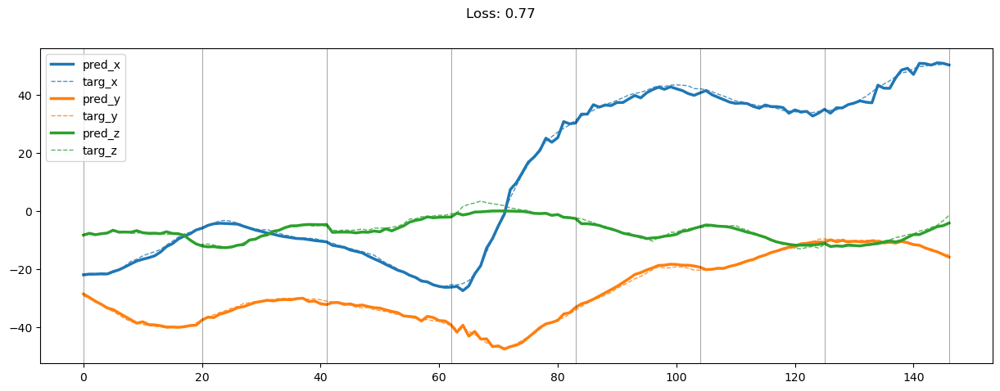

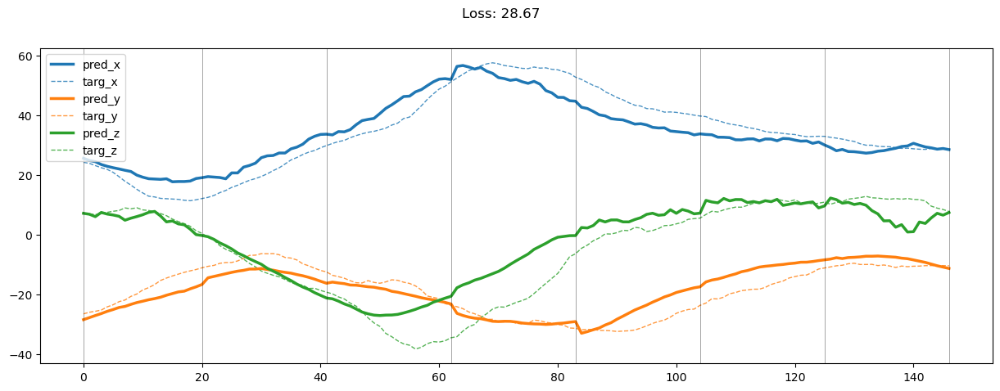

04799: train loss:  2.320, imu loss:  0.675, mag loss:  1.645
       valid loss:  173.086, imu loss:  0.509, mag loss:  172.578
04819: train loss:  2.404, imu loss:  0.689, mag loss:  1.715
       valid loss:  174.198, imu loss:  0.509, mag loss:  173.689
04839: train loss:  5.088, imu loss:  0.673, mag loss:  4.415
       valid loss:  182.069, imu loss:  0.509, mag loss:  181.560
04859: train loss:  2.397, imu loss:  0.683, mag loss:  1.714
       valid loss:  175.820, imu loss:  0.509, mag loss:  175.312
04879: train loss:  2.322, imu loss:  0.676, mag loss:  1.646
       valid loss:  172.234, imu loss:  0.509, mag loss:  171.725
04899: train loss:  2.307, imu loss:  0.677, mag loss:  1.630
       valid loss:  170.401, imu loss:  0.509, mag loss:  169.893
04919: train loss:  2.372, imu loss:  0.682, mag loss:  1.690
       valid loss:  171.975, imu loss:  0.509, mag loss:  171.466
04939: train loss:  2.263, imu loss:  0.672, mag loss:  1.591
       valid loss:  174.092, imu loss:  0.

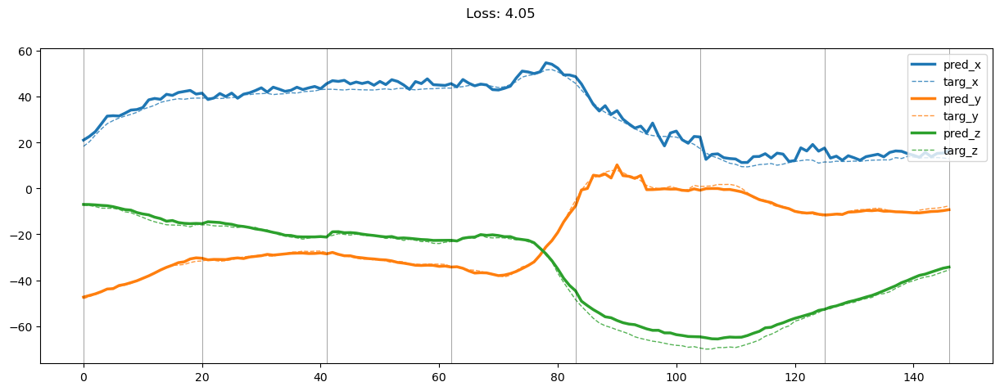

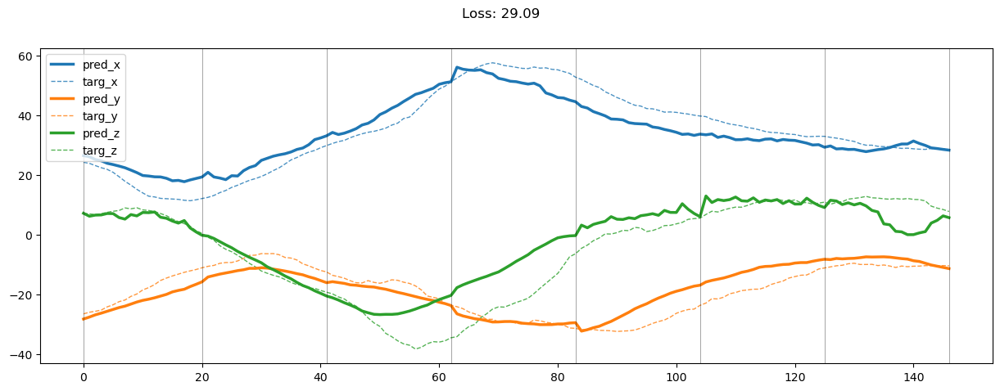

04999: train loss:  2.253, imu loss:  0.680, mag loss:  1.574
       valid loss:  175.147, imu loss:  0.509, mag loss:  174.639
05019: train loss:  2.282, imu loss:  0.681, mag loss:  1.601
       valid loss:  172.360, imu loss:  0.509, mag loss:  171.851
05039: train loss:  2.238, imu loss:  0.680, mag loss:  1.559
       valid loss:  172.945, imu loss:  0.509, mag loss:  172.436
05059: train loss:  2.300, imu loss:  0.679, mag loss:  1.620
       valid loss:  175.083, imu loss:  0.509, mag loss:  174.574
05079: train loss:  2.239, imu loss:  0.672, mag loss:  1.568
       valid loss:  172.982, imu loss:  0.509, mag loss:  172.473
05099: train loss:  2.217, imu loss:  0.680, mag loss:  1.537
       valid loss:  173.359, imu loss:  0.509, mag loss:  172.851
05119: train loss:  2.293, imu loss:  0.679, mag loss:  1.614
       valid loss:  174.585, imu loss:  0.509, mag loss:  174.076
05139: train loss:  2.225, imu loss:  0.680, mag loss:  1.546
       valid loss:  172.696, imu loss:  0.

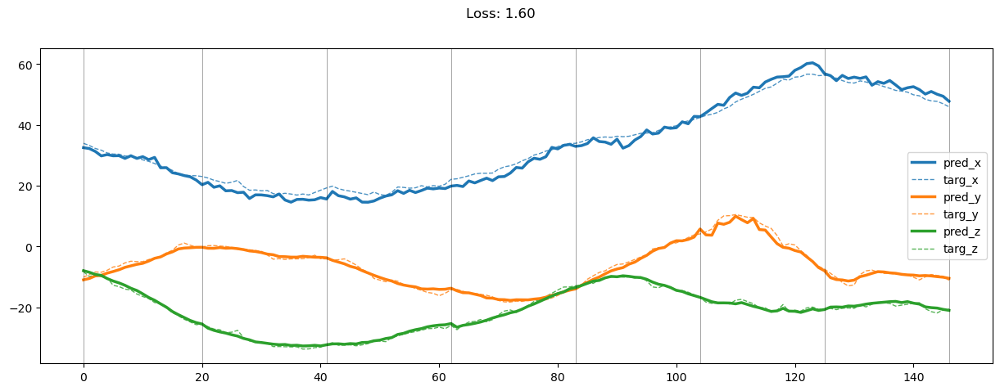

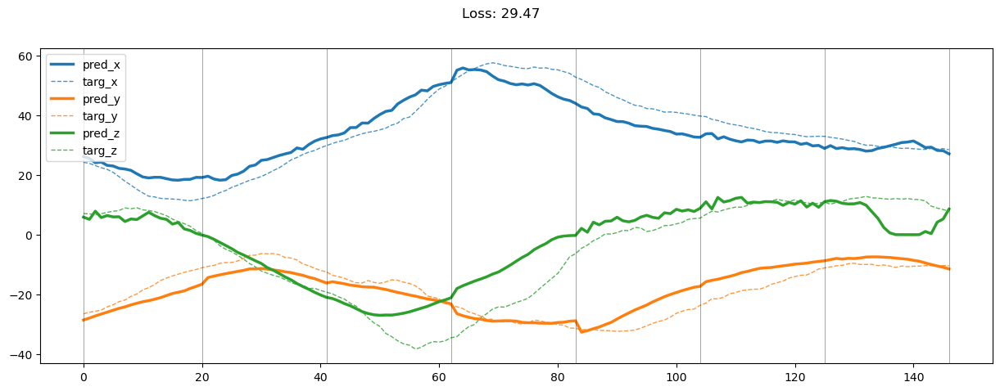

05199: train loss:  2.209, imu loss:  0.681, mag loss:  1.528
       valid loss:  172.287, imu loss:  0.509, mag loss:  171.778
05219: train loss:  2.181, imu loss:  0.674, mag loss:  1.507
       valid loss:  172.368, imu loss:  0.509, mag loss:  171.860
05239: train loss:  2.263, imu loss:  0.680, mag loss:  1.584
       valid loss:  172.522, imu loss:  0.509, mag loss:  172.013
05259: train loss:  2.211, imu loss:  0.679, mag loss:  1.532
       valid loss:  171.667, imu loss:  0.509, mag loss:  171.159
05279: train loss:  2.199, imu loss:  0.680, mag loss:  1.519
       valid loss:  173.918, imu loss:  0.509, mag loss:  173.410
05299: train loss:  2.148, imu loss:  0.672, mag loss:  1.476
       valid loss:  173.703, imu loss:  0.509, mag loss:  173.195
05319: train loss:  2.169, imu loss:  0.671, mag loss:  1.498
       valid loss:  174.326, imu loss:  0.509, mag loss:  173.818
05339: train loss:  2.194, imu loss:  0.674, mag loss:  1.519
       valid loss:  171.858, imu loss:  0.

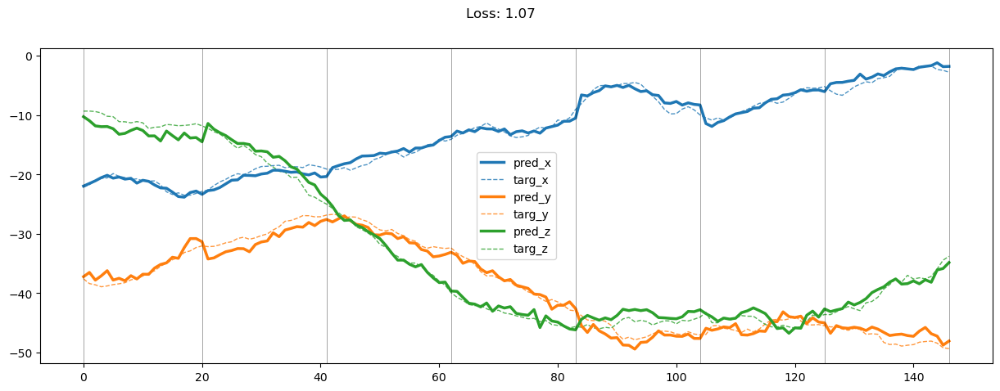

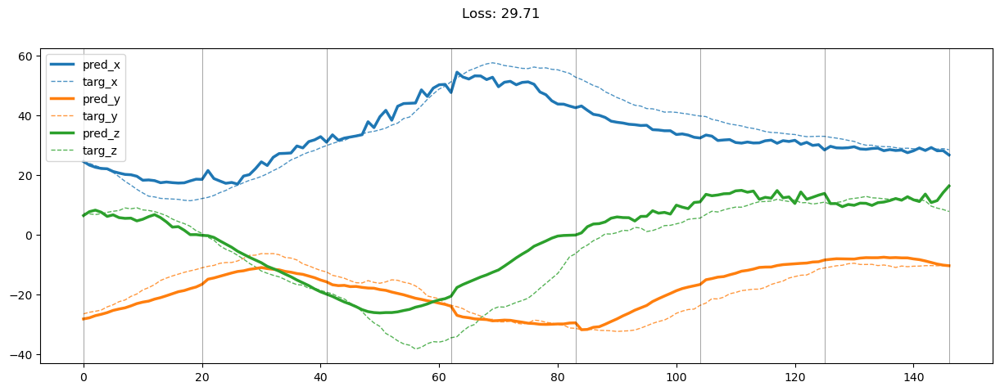

05399: train loss:  3.016, imu loss:  0.673, mag loss:  2.343
       valid loss:  198.212, imu loss:  0.509, mag loss:  197.703
05419: train loss:  2.536, imu loss:  0.679, mag loss:  1.857
       valid loss:  193.980, imu loss:  0.509, mag loss:  193.472
05439: train loss:  2.443, imu loss:  0.685, mag loss:  1.758
       valid loss:  193.857, imu loss:  0.509, mag loss:  193.349
05459: train loss:  2.369, imu loss:  0.680, mag loss:  1.689
       valid loss:  190.304, imu loss:  0.509, mag loss:  189.796
05479: train loss:  2.323, imu loss:  0.684, mag loss:  1.639
       valid loss:  187.311, imu loss:  0.509, mag loss:  186.803
05499: train loss:  2.237, imu loss:  0.681, mag loss:  1.557
       valid loss:  187.848, imu loss:  0.509, mag loss:  187.340
05519: train loss:  2.236, imu loss:  0.680, mag loss:  1.556
       valid loss:  185.689, imu loss:  0.509, mag loss:  185.181
05539: train loss:  2.238, imu loss:  0.670, mag loss:  1.568
       valid loss:  181.565, imu loss:  0.

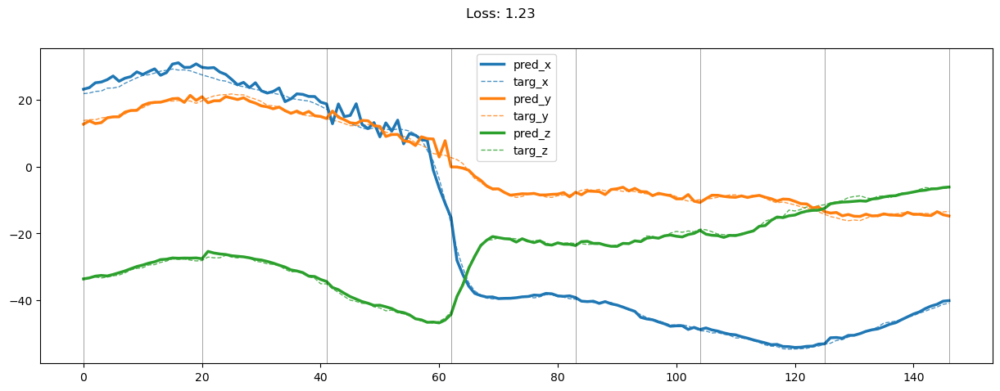

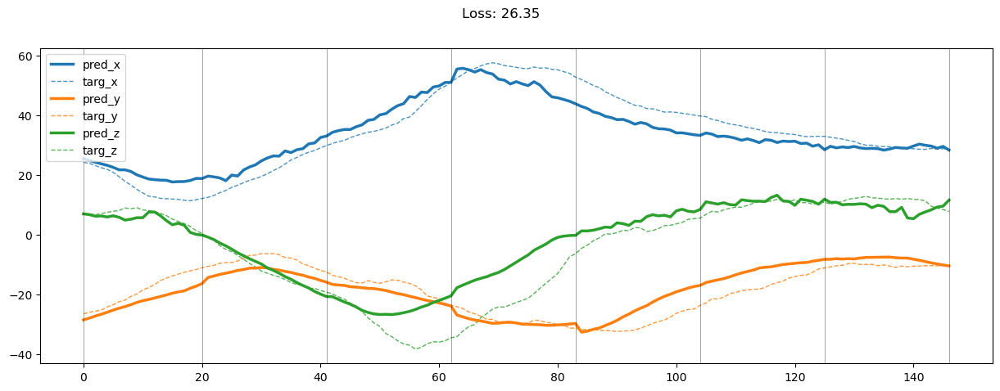

05599: train loss:  2.109, imu loss:  0.682, mag loss:  1.427
       valid loss:  179.465, imu loss:  0.509, mag loss:  178.956
05619: train loss:  2.197, imu loss:  0.679, mag loss:  1.518
       valid loss:  179.426, imu loss:  0.509, mag loss:  178.918
05639: train loss:  2.190, imu loss:  0.681, mag loss:  1.509
       valid loss:  179.651, imu loss:  0.509, mag loss:  179.143
05659: train loss:  2.079, imu loss:  0.675, mag loss:  1.404
       valid loss:  177.487, imu loss:  0.509, mag loss:  176.979
05679: train loss:  2.081, imu loss:  0.675, mag loss:  1.406
       valid loss:  178.079, imu loss:  0.509, mag loss:  177.571
05699: train loss:  2.080, imu loss:  0.680, mag loss:  1.400
       valid loss:  176.678, imu loss:  0.509, mag loss:  176.169
05719: train loss:  2.062, imu loss:  0.683, mag loss:  1.379
       valid loss:  175.556, imu loss:  0.509, mag loss:  175.047
05739: train loss:  2.085, imu loss:  0.671, mag loss:  1.414
       valid loss:  175.215, imu loss:  0.

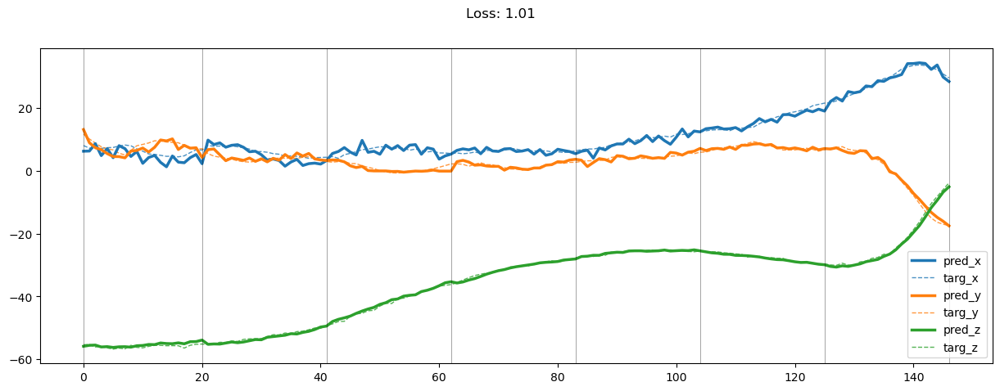

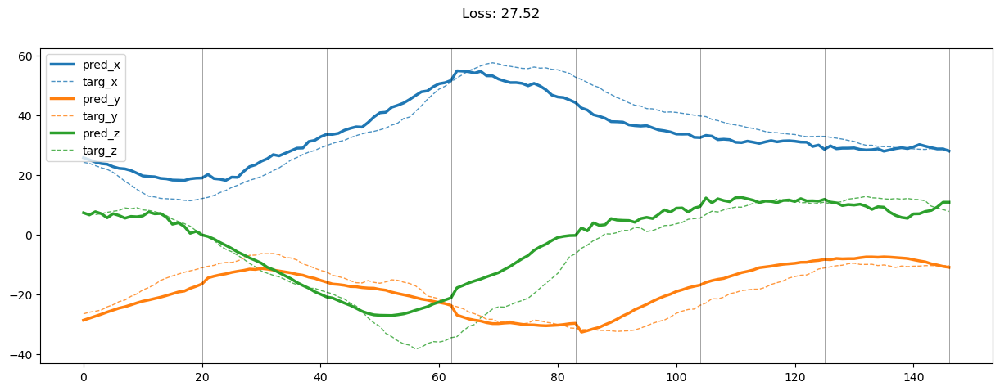

05799: train loss:  2.032, imu loss:  0.677, mag loss:  1.356
       valid loss:  174.869, imu loss:  0.509, mag loss:  174.361
05819: train loss:  2.060, imu loss:  0.681, mag loss:  1.379
       valid loss:  174.208, imu loss:  0.509, mag loss:  173.699
05839: train loss:  2.001, imu loss:  0.679, mag loss:  1.321
       valid loss:  175.733, imu loss:  0.509, mag loss:  175.224
05859: train loss:  2.056, imu loss:  0.677, mag loss:  1.379
       valid loss:  175.008, imu loss:  0.509, mag loss:  174.499
05879: train loss:  1.961, imu loss:  0.680, mag loss:  1.281
       valid loss:  172.461, imu loss:  0.509, mag loss:  171.952
05899: train loss:  2.034, imu loss:  0.679, mag loss:  1.355
       valid loss:  174.538, imu loss:  0.509, mag loss:  174.030
05919: train loss:  1.991, imu loss:  0.676, mag loss:  1.315
       valid loss:  173.416, imu loss:  0.509, mag loss:  172.907
05939: train loss:  1.977, imu loss:  0.676, mag loss:  1.301
       valid loss:  173.332, imu loss:  0.

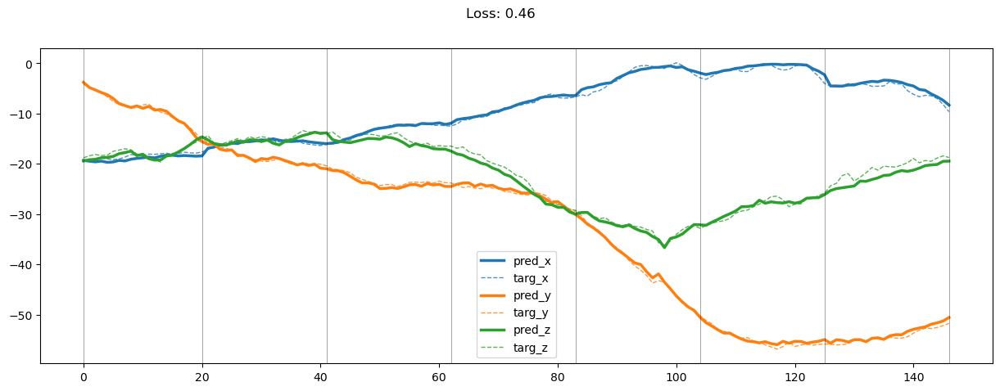

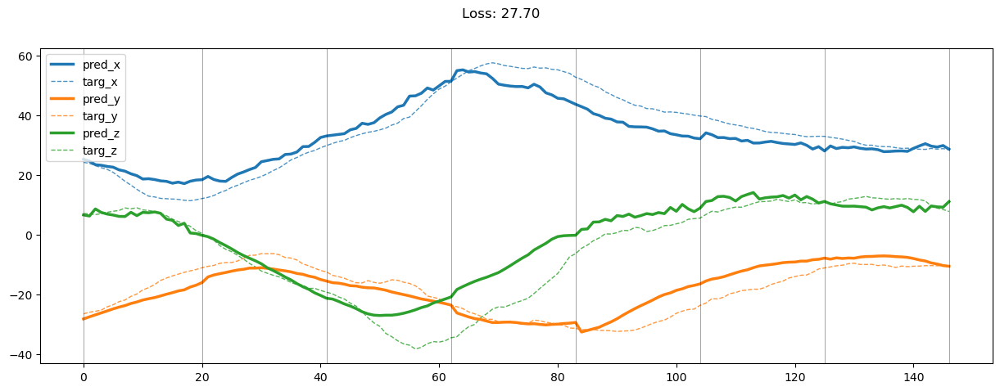

05999: train loss:  1.954, imu loss:  0.675, mag loss:  1.279
       valid loss:  173.232, imu loss:  0.509, mag loss:  172.723


In [47]:
draw = False

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 200 == 0:
        draw = True
    
    train_loss, train_imu_loss, train_mag_loss = train(train_loader, draw)
    valid_loss, valid_imu_loss, valid_mag_loss = evalute(valid_loader, draw)
    
    draw = False
    
    if (epoch + 1) % 20 == 0:
        ep = str(epoch).zfill(5)
        print(f'{ep:>5}: train loss: {train_loss: 2.3f}, imu loss: {train_imu_loss: 2.3f}, mag loss: {train_mag_loss: 2.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss: 2.3f}, imu loss: {valid_imu_loss: 2.3f}, mag loss: {valid_mag_loss: 2.3f}')

In [40]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :, :6]
            source_mag = source_data[:, :, :, 6:9]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :, :6]
            target_mag = target_data[:, :, :, 6:9]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
            gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            
            results.extend(zip(predict_mag.detach().cpu().numpy(), target_data[:, :, :, 6:9].cpu().numpy()))
            
            break
    
    return np.array(results)

In [41]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(256, 2, 7, 21, 3)


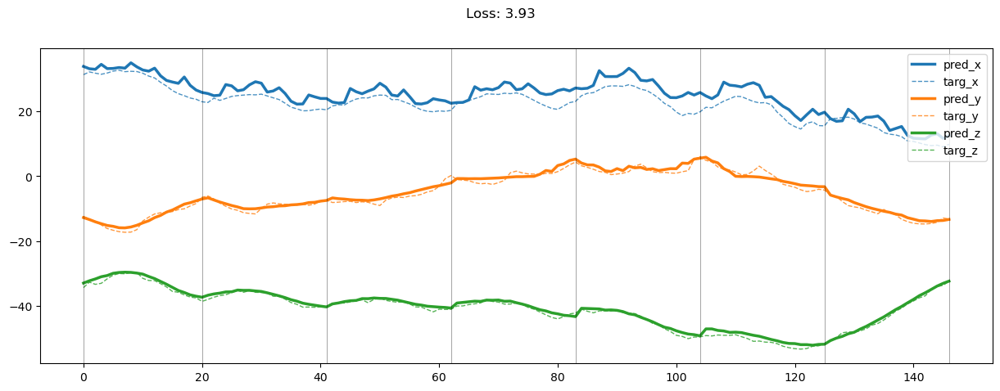

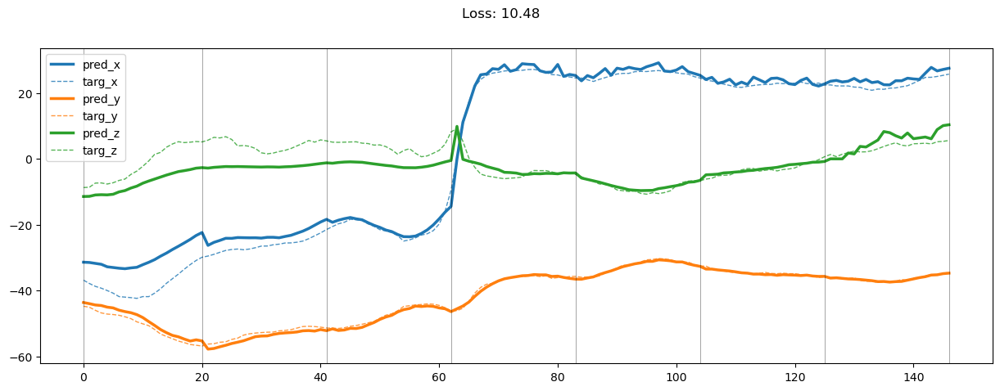

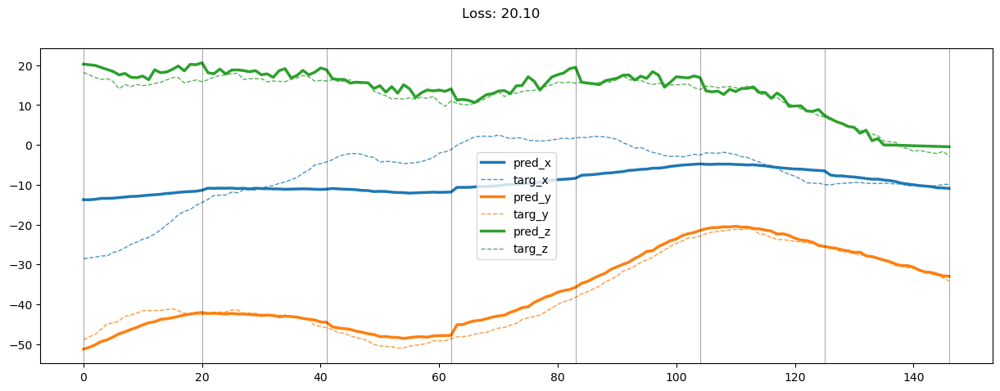

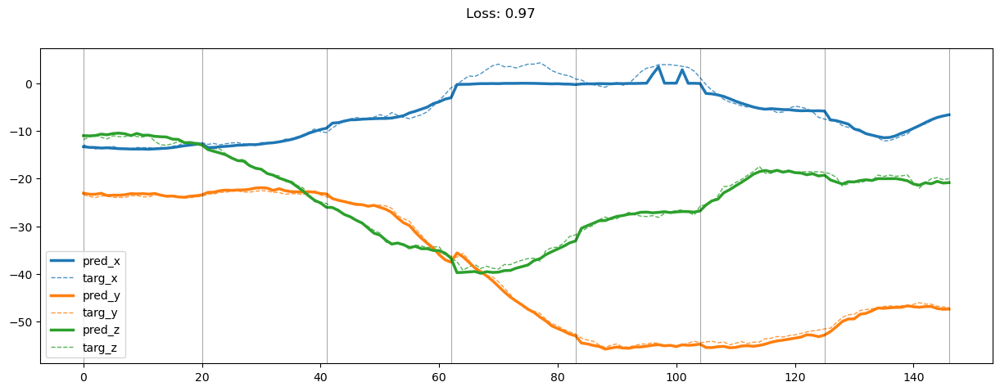

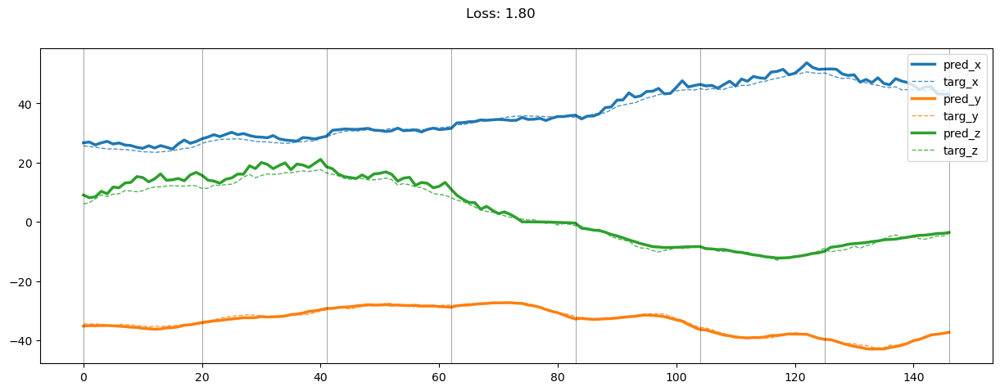

...

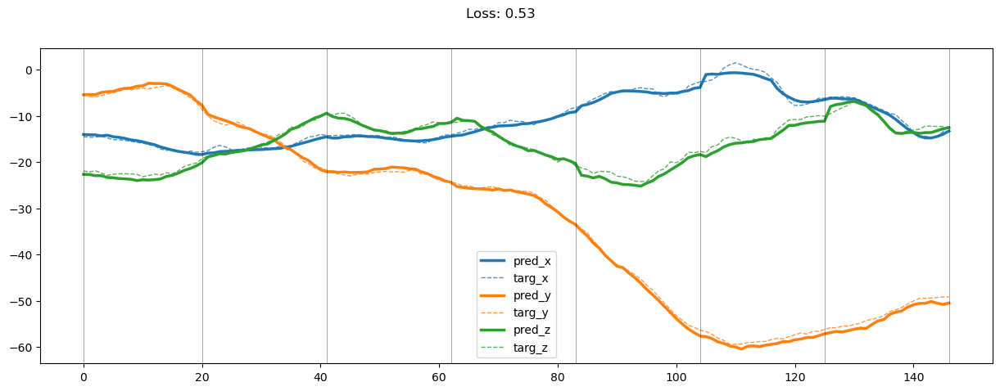

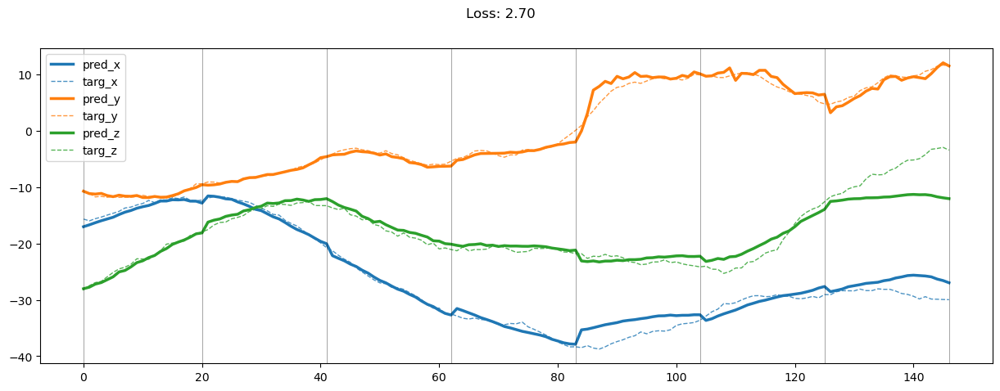

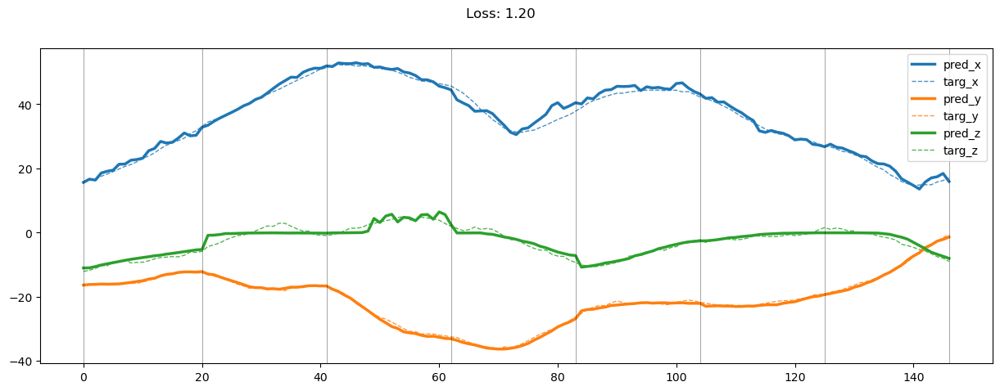

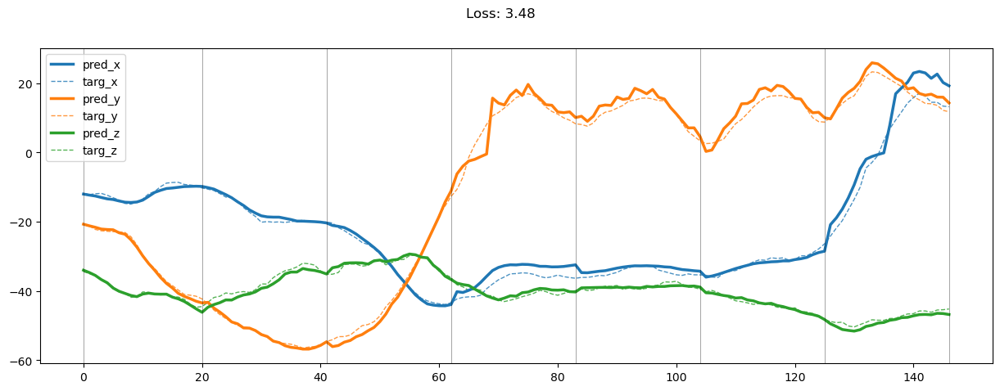

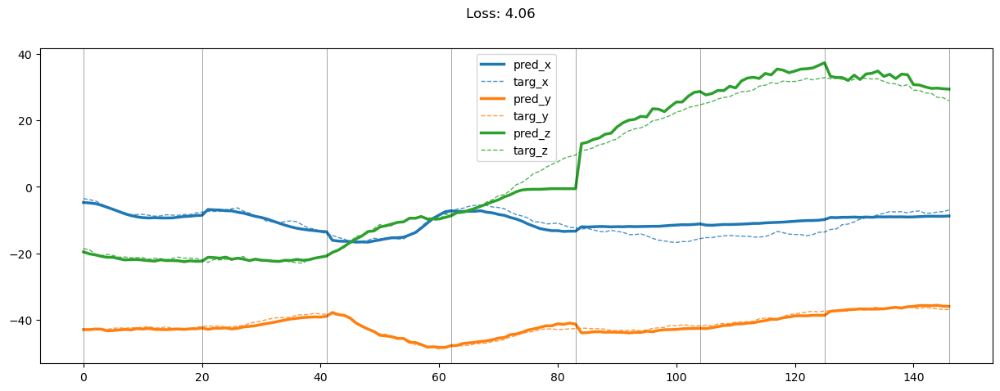

In [45]:
results = output_eval(model, train_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)

(225, 2, 7, 21, 3)


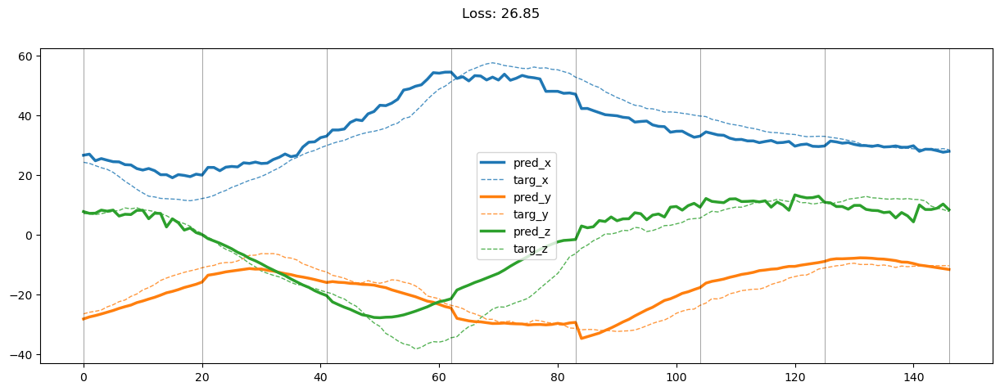

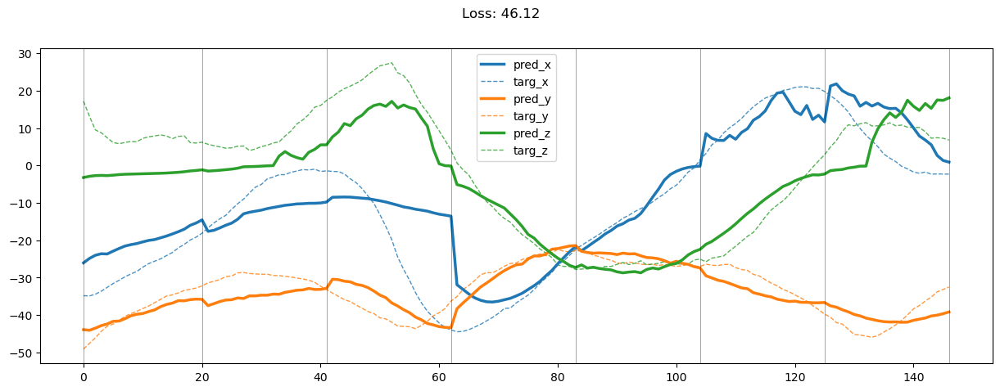

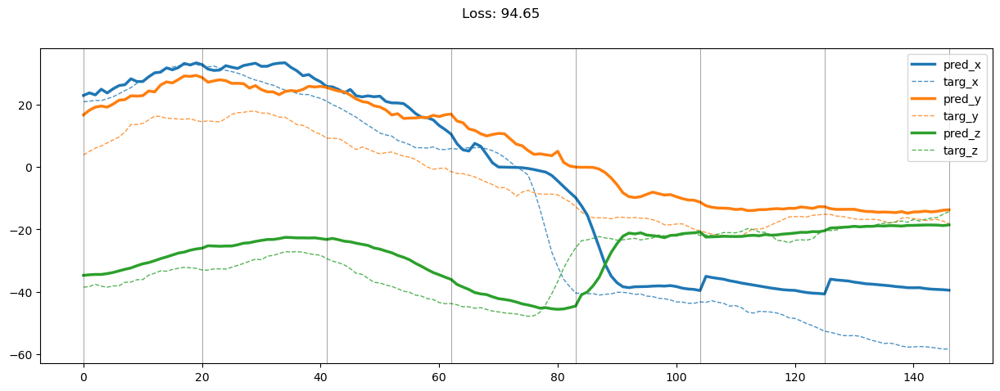

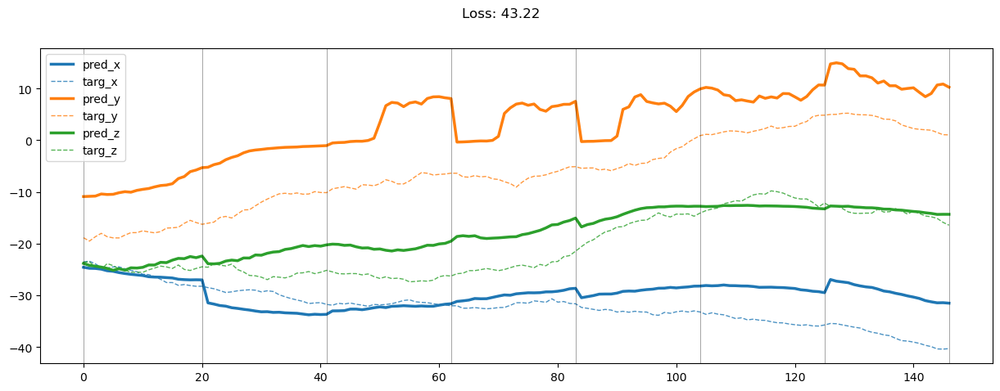

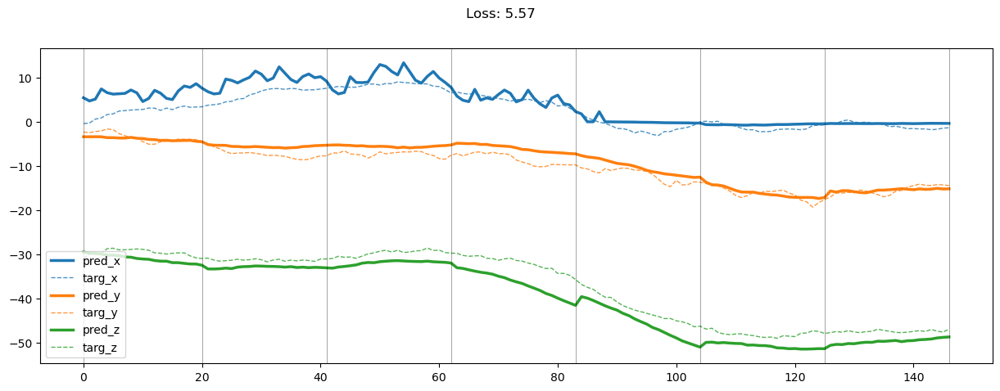

...

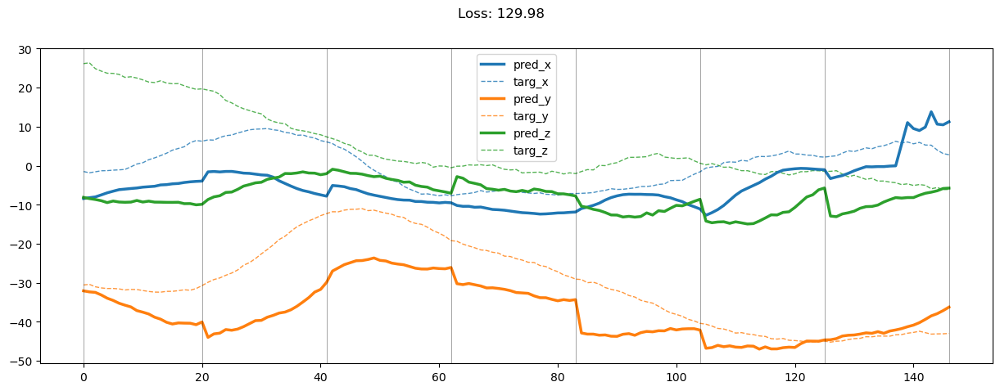

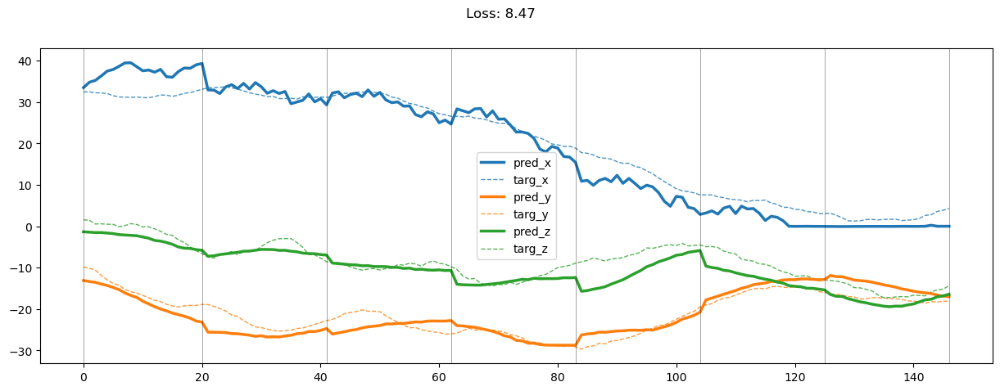

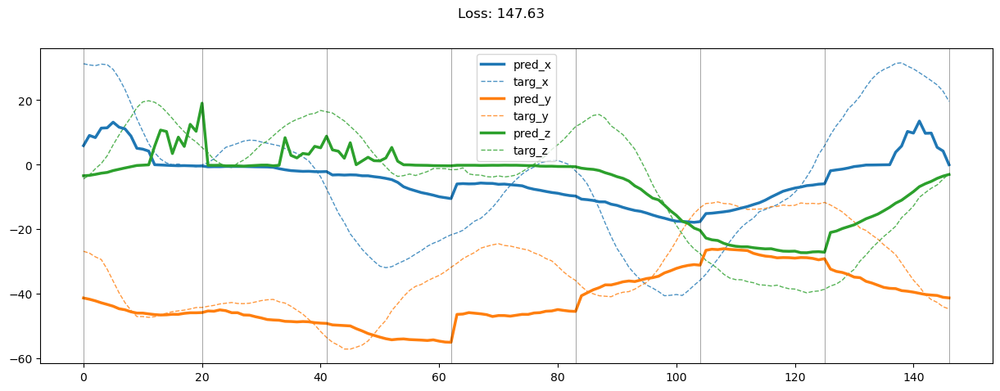

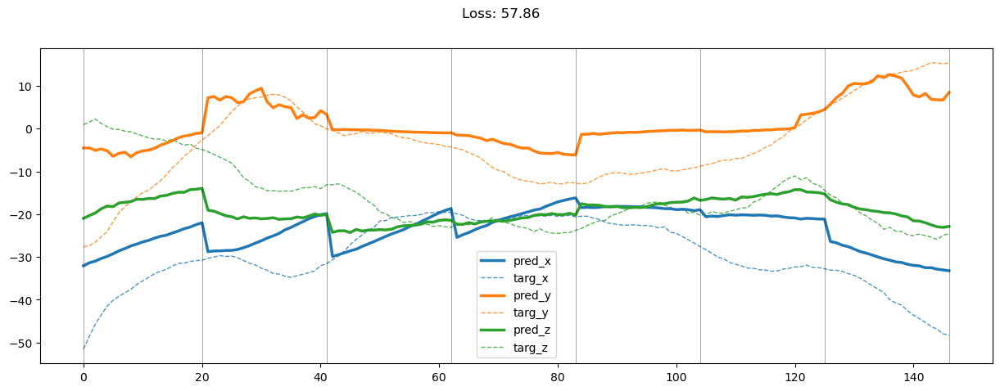

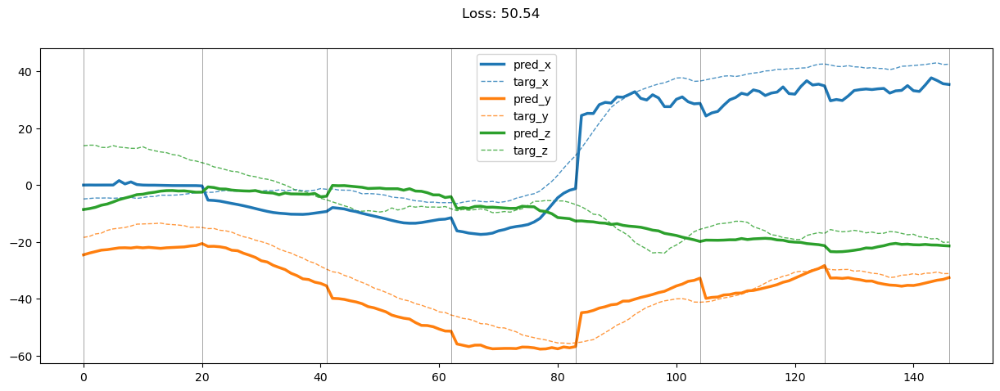

In [46]:
results = output_eval(model, valid_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)